# UrbanSound8K: Comparative Study of CNNs and Transformers for Environmental Sound Classification

## Description

This project investigates different deep learning approaches for environmental sound classification using the UrbanSound8K dataset. Three pipelines are explored:

1. Image-based classification using Mel-spectrograms and 2D CNNs.
2. Temporal modeling using raw waveform signals and 1D CNN architectures.
3. Attention-based models using Audio Spectrogram Transformers.

The models are compared based on:

- Classification accuracy
- Inference speed
- Model size

The best model is deployed through a demonstration application.

## Project Goal

### Main Goal

Learn audio machine learning by understanding how sounds can be represented and classified using different neural network architectures.

### Specific Objectives

- Understand digital audio signals.
- Learn audio preprocessing techniques.
- Generate spectrogram representations.
- Build 2D CNN audio classifiers.
- Build 1D waveform classifiers.
- Explore Transformer-based audio classification.
- Compare multiple architectures.
- Build a Demo App with the best model

## Dataset

### UrbanSound8K

Contains 8732 audio clips belonging to 10 classes:

| Class            |
| ---------------- |
| Air Conditioner  |
| Car Horn         |
| Children Playing |
| Dog Bark         |
| Drilling         |
| Engine Idling    |
| Gun Shot         |
| Jackhammer       |
| Siren            |
| Street Music     |


## Overall Architecure

```

                        Raw Audio (.wav)
                             |
                     Common Preprocessing
      (Mono, Resample, Pad/Truncate, Normalize)
                             |
          ------------------------------------------------
          |                     |                        |
          |                     |                        |
    Pipeline 1             Pipeline 2              Pipeline 3
      Vision                Temporal                Attention
          |                     |                        |
    Mel Spectrogram         Raw Waveform          Log-Mel Spectrogram
          |                     |                        |
     Simple CNN               M5 CNN                     AST
          |                     |                        |
        ResNet18            (optional)             Transformer Encoder
          ------------------------------------------------
                             |
                  Evaluation & Comparison
          (Accuracy, Latency, Parameters, F1)
                             |
                      Demo Application
```

## Phase 0: Audio Fundamentals

before i start coding, i should understand what audio actually is

</br>

Researches let us think of audio us:
```
Image Pixels
    ↓
2D matrix


Text Words
    ↓
Sequence


Audio Amplitude values
    ↓
1D signal
```
</br>

A `.wav` file is essentially:
``` python
[0.02,
0.10,
-0.15,
0.32,
...]
```
that is thousands of values per second roughly.

### Concepts to understand

</br>

#### Sampling rate
example: `22050 Hz`

means: 22050 measurements every second.

</br>

#### Waveform
```
Amplitude
 ^
 |
 |       /\      /\
 |      /  \    /  \
 |_____/____\__/____\____ Time
```

</br>

#### Spectrogram
A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time.

A spectrogram is usually depicted as an image with the amplitude shown by varying the color or brightness.

A Spectrogram is referred to as Colormap or Campbell plot in automotive acoustics

A Spectrogram transforms sound into an image:
```
Frequency
↑
|
| ██
| ███
|█████
|██████
--------------------> Time
```
brightness = energy

Actually researches shows that, that is why CNNs work so well.

</br>

**How is it created?**

To create a spectrogram, several Fourier Transforms of the signal are performed at multiple instances in time.

These Fourier Transforms are assembled into a plot with three dimensions (time, frequency and amplitude).

Usually, time and frequency are along X or Y axis while amplitude is represented by a color scale.


### Key Takeaways

- Audio is represented as a waveform.
- Sampling rate determines temporal resolution.
- Spectrograms transform sounds into image-like representations.
- CNNs can exploit spectrograms similarly to images.

## Phase 1: Environment Setup

Google Colab + PyTorch

Libraries that i will be using:
```
torch
torchaudio
torchvision
numpy
pandas
matplotlib
librosa
scikit-learn
seaborn
tqdm
```

## Phase 2: Data Loading and Exploration

The purpose of this phase is to answer questions such as:

- What does the dataset contain?
- How many classes are there?
- Is the dataset balanced?
- What does an audio sample look like?
- How is audio represented?
- How long are the clips?
- What do different classes sound like?
- What do their waveforms and spectrograms look like?

### Loading Metadata

The UrbanSound8K dataset provides a CSV file containing information about every audio file. i will use that CSV file. I observed some issue working with the csv file so that i loading the dataset using huggingface

In [ ]:
!pip install datasets huggingface_hub

In [ ]:
from huggingface_hub import snapshot_download
import os

# creating the directory if it doesn't exist
os.makedirs('/content/UrbanSound8K', exist_ok = True)

# downloading the repository to the specific folder
snapshot_download(
    repo_id = "danavery/urbansound8k",
    repo_type = "dataset",
    local_dir = "/content/UrbanSound8K",
    local_dir_use_symlinks = False
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `snapshot_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

'/content/UrbanSound8K'

In [ ]:
# imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# loading metadata

# defining the raw url to the UrbanSound8K CSV file
csv_url = "/content/UrbanSound8K/UrbanSound8K.csv"

metadata = pd.read_csv(csv_url)
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [ ]:
# exploring the dimensions

metadata.shape

(8732, 8)

In [ ]:
print(f"There are {metadata.shape[0]} audio samples")
print(f"There are {metadata.shape[1]} metadata columns")

There are 8732 audio samples
There are 8 metadata columns


In [ ]:
# listing column names

metadata.columns

Index(['slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold',
       'classID', 'class'],
      dtype='object')

### Understanding the Dataset

In [ ]:
# looking at data types

metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8732 entries, 0 to 8731
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   slice_file_name  8732 non-null   object 
 1   fsID             8732 non-null   int64  
 2   start            8732 non-null   float64
 3   end              8732 non-null   float64
 4   salience         8732 non-null   int64  
 5   fold             8732 non-null   int64  
 6   classID          8732 non-null   int64  
 7   class            8732 non-null   object 
dtypes: float64(2), int64(4), object(2)
memory usage: 545.9+ KB


In [ ]:
# checking missing values

metadata.isnull().sum()

,0
slice_file_name,0
fsID,0
start,0
end,0
salience,0
fold,0
classID,0
class,0


0 missing values

### Class Distribution

that is to verify whether the dataset that i am working with is balanced or not.

In [ ]:
# counting examples

metadata["class"].value_counts()

,count
class,
dog_bark,1000
children_playing,1000
air_conditioner,1000
street_music,1000
jackhammer,1000
engine_idling,1000
drilling,1000
siren,929
car_horn,429


In [ ]:
metadata["class"].value_counts().index

Index(['dog_bark', 'children_playing', 'air_conditioner', 'street_music',
       'jackhammer', 'engine_idling', 'drilling', 'siren', 'car_horn',
       'gun_shot'],
      dtype='object', name='class')

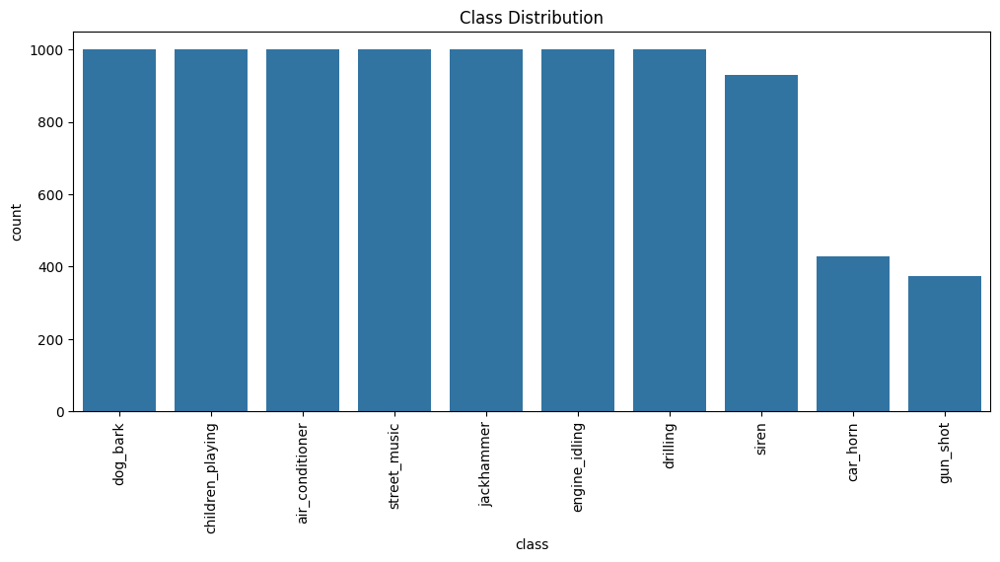

In [ ]:
# plotting the class distribution

plt.figure(figsize = (12, 5))

sns.countplot(
    data = metadata,
    x = "class", # colum name
    order = metadata["class"].value_counts().index
)

plt.xticks(rotation = 90)
plt.title("Class Distribution")
plt.show()

**Are some classes dominant?**

**YES**. we can see that dog_bark, children_playing, air_conditioner, street_music, jackhammer, engine_idling, drilling have all `1000` data observations. while siren, car_horn and gun_shot have `929`, `429` and `374` respectively.

**Is the dataset balanced?**

**NO**. It is not a perfectly balanced dataset.

**potential issues**:

**Bias**: the model will be naturally biased toward the over-represented classes (the ones with \(1,000\) observations). It might perform excellently on jackhammer sounds but struggle to generalize for gun_shot.

**Will i need weighted loss later?**

**YES**. I will likely need a weighted loss function (or a similar class-balancing technique) if i want my model that i will be building to perform well on the minority classes.

### Inspecting Random Samples

that is for observing file name, fold and class label as a quick check and pagination.

In [ ]:
import random

index = random.randint(0, 8732 - 1)
print(f"index: {index}")

metadata.sample(index)

index: 7290


,slice_file_name,fsID,start,end,salience,fold,classID,class
5110,197320-6-1-0.wav,197320,2.884010,4.914352,1,2,6,gun_shot
1453,135527-6-4-0.wav,135527,10.486146,12.680921,2,7,6,gun_shot
834,116484-3-0-16.wav,116484,8.000000,12.000000,1,4,3,dog_bark
6105,33340-7-14-0.wav,33340,67.270665,68.840508,1,8,7,jackhammer
96,101848-9-0-2.wav,101848,1.000000,5.000000,1,7,9,street_music
...,...,...,...,...,...,...,...,...
1443,135527-6-14-2.wav,135527,49.406976,53.406976,2,7,6,gun_shot
6708,52882-2-0-3.wav,52882,1.500000,5.500000,1,6,2,children_playing
1717,144068-5-0-10.wav,144068,27.794739,31.794739,1,3,5,engine_idling
3935,177729-0-0-69.wav,177729,34.500000,38.500000,2,7,0,air_conditioner


### Loading Audio Files

moving from metadata to the actual sound

In [ ]:
# imports

import torch

import torchaudio
import os

In [ ]:
type(metadata)

pandas.core.frame.DataFrame

In [ ]:
# let's select the first sample from the metadata and see
'''
.iloc : select rows and columns from a DataFrame or Series
        by their integer-location (numerical index) positions.
'''

sample = metadata.iloc[0]

sample


,0
slice_file_name,100032-3-0-0.wav
fsID,100032
start,0.0
end,0.317551
salience,1
fold,5
classID,3
class,dog_bark


In [ ]:
audio_path = (
    f"/content/UrbanSound8K/audio/fold{sample['fold']}/"
    f"{sample['slice_file_name']}"
)

audio_path

'/content/UrbanSound8K/audio/fold5/100032-3-0-0.wav'

In [ ]:
waveform, sample_rate = torchaudio.load(audio_path)

print(waveform.shape)
print(sample_rate)

RuntimeError: Failed to create AudioDecoder for /content/UrbanSound8K/audio/fold5/100032-3-0-0.wav: SingleStreamDecoder, /__w/torchcodec/torchcodec/meta-pytorch/torchcodec/src/torchcodec/_core/SingleStreamDecoder.cpp:51, Could not open input file: /content/UrbanSound8K/audio/fold5/100032-3-0-0.wav No such file or directory

The error is happening because the code assumes the original **UrbanSound8K** folder structure, but the dataset I downloaded from Hugging Face is not the original **UrbanSound8K** dataset.

the code expects:
```
UrbanSound8K/
│
├── audio/
│   ├── fold1/
│   ├── fold2/
│   ├── ...
│   └── fold10/
│
└── UrbanSound8K.csv
```

but the i have:
```
UrbanSound8K/
│
├── data/
│   ├── train-00000-of-00016.parquet
│   ├── train-00001-of-00016.parquet
│   └── ...
│
├── UrbanSound8K.csv
└── README.md
```

Therefore the path:
``` Python
/content/UrbanSound8K/audio/fold5/100032-3-0-0.wav
```
does not exist

In [ ]:
# checking if the audio_path that i set exist

print(os.path.exists(audio_path))

False


The thing, is actually The original Hugging Face dataset `repo_id = "danavery/urbansound8k"` has been converted into Parquet files. Instead of storing `audio/foldX/file.wav`. It stores the audio directly inside Parquet records.

So
``` Python
torchaudio.load(audio_path)
```
cannot work because there are no `.wav` files on disk.


#### Fix

Since I am doing a modern ML project, I should load the dataset through the Hugging Face datasets library

In [ ]:
from datasets import load_dataset

In [ ]:
dataset = load_dataset("danavery/urbansound8k")

README.md:   0%|          | 0.00/5.66k [00:00<?, ?B/s]

data/train-00000-of-00016-e478d7cccca6a0(…):   0%|          | 0.00/434M [00:00<?, ?B/s]

data/train-00001-of-00016-299138aa39afaa(…):   0%|          | 0.00/472M [00:00<?, ?B/s]

data/train-00002-of-00016-887e0748205b6f(…):   0%|          | 0.00/384M [00:00<?, ?B/s]

data/train-00003-of-00016-691ee48aa53d9c(…):   0%|          | 0.00/447M [00:00<?, ?B/s]

data/train-00004-of-00016-c0f37514d8e28a(…):   0%|          | 0.00/441M [00:00<?, ?B/s]

data/train-00005-of-00016-55ef1a0a51149c(…):   0%|          | 0.00/591M [00:00<?, ?B/s]

data/train-00006-of-00016-0ef363072505e6(…):   0%|          | 0.00/496M [00:00<?, ?B/s]

data/train-00007-of-00016-dfac173beb21e5(…):   0%|          | 0.00/588M [00:00<?, ?B/s]

data/train-00008-of-00016-2744487f32f65d(…):   0%|          | 0.00/493M [00:00<?, ?B/s]

data/train-00009-of-00016-83fc7364d47981(…):   0%|          | 0.00/549M [00:00<?, ?B/s]

data/train-00010-of-00016-4c1d0e285ed778(…):   0%|          | 0.00/353M [00:00<?, ?B/s]

data/train-00011-of-00016-79d186503a2667(…):   0%|          | 0.00/316M [00:00<?, ?B/s]

data/train-00012-of-00016-6aff88fdcca229(…):   0%|          | 0.00/372M [00:00<?, ?B/s]

data/train-00013-of-00016-17d827b1a5be04(…):   0%|          | 0.00/348M [00:00<?, ?B/s]

data/train-00014-of-00016-c630762df85f6c(…):   0%|          | 0.00/381M [00:00<?, ?B/s]

data/train-00015-of-00016-03506887d89adf(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/8732 [00:00<?, ? examples/s]

In [ ]:
# checking if the data was loading

dataset

DatasetDict({
    train: Dataset({
        features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
        num_rows: 8732
    })
})

In [ ]:
# inspecting a sample

sample = dataset["train"][0]

sample

{'audio': <datasets.features._torchcodec.AudioDecoder at 0x7dc748578b30>,
 'slice_file_name': '100032-3-0-0.wav',
 'fsID': 100032,
 'start': 0.0,
 'end': 0.317551,
 'salience': 1,
 'fold': 5,
 'classID': 3,
 'class': 'dog_bark'}

In [ ]:
sample.keys()

dict_keys(['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'])

In [ ]:
type(sample["audio"])

datasets.features._torchcodec.AudioDecoder

In [ ]:
# accessing audio

audio = sample["audio"]

audio

In [ ]:
'''
looking for the following methods:
get_all_samples
get_samples_played_in_range
metadata
'''

dir(audio)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_decoder',
 '_desired_sample_rate',
 '_hf_encoded',
 'get_all_samples',
 'get_samples_played_in_range',
 'metadata',
 'stream_index']

In [ ]:
# decoding the audio as the new version of the HuggingFace datasets library
"""
as the audio column is returned as an AudioDecoder object rather
than a dictionary
"""

audio = sample["audio"]

decoded = audio.get_all_samples()

decoded

AudioSamples:
  data (shape): torch.Size([2, 14004])
  pts_seconds: 0.0
  duration_seconds: 0.31755102040816324
  sample_rate: 44100

In [ ]:
type(decoded)

torchcodec._frame.AudioSamples

In [ ]:
dir(decoded)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__class_getitem__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__post_init__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 'data',
 'duration_seconds',
 'pts_seconds',
 'sample_rate']

In [ ]:
decoded.data

tensor([[-4.5776e-03, -4.8828e-03, -4.6082e-03,  ..., -5.7983e-04,
         -4.2725e-04,  3.0518e-05],
        [-4.5166e-03, -4.7913e-03, -4.6082e-03,  ..., -7.3242e-04,
         -5.4932e-04, -3.0518e-05]])

In [ ]:
decoded.sample_rate

44100

In [ ]:
# extracting waveform and sample rate

audio = sample["audio"]

decoded = audio.get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

print(f"waveform shape: {waveform.shape}")
print(f"sample rate: {sample_rate}")

waveform shape: torch.Size([2, 14004])
sample rate: 44100


#### Understanding the waveform tensor

**meaning of the shape of the waveform**

(number_of_channels, number_of_samples)

so:
```
2 channels
14004 samples per channel
```

**stereo audio**

Channel 1 (Left speaker)

Channel 2 (Right speaker)

if the audio were **mono**, we would have: `torch.Size([1, 14004])`, meaning only one channel.

</br>

**14004 samples**

at 44100 Hz the duration is:
```
14004 / 44100 ≈ 0.318 seconds
```
so this audio clip lasts about 0.318 seconds

In [ ]:
len(dataset["train"])

8732

In [ ]:
# trying to figure out if all the clips have the same duration


five_clips_recorded_duration = {}

for i in range(5):
  index = random.randint(0, len(dataset["train"]) - 1)
  sample = dataset["train"][index]

  audio = sample["audio"]
  decoded = audio.get_all_samples()

  waveform = decoded.data
  sample_rate = decoded.sample_rate

  duration = waveform.shape[1] / sample_rate

  five_clips_recorded_duration[i] = duration

five_clips_recorded_duration



{0: 4.0, 1: 4.0, 2: 4.0, 3: 4.0, 4: 4.0}

The clips apparently have different lengths.

why is that?

Because actually UrbanSound8K contains audio excerpts extracted from longer recordings. And this creates a challenge because neural networks typically expect inputs of the same size.

#### Converting stereo to mono

because for classification task only, mono is usually sufficient.

In [ ]:
sample = dataset["train"][random.randint(1, len(dataset["train"]) - 1)]

audio = sample["audio"]
decoded = audio.get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

print(f"waveform shape: {waveform.shape}")
print(f"sample rate: {sample_rate}")

waveform shape: torch.Size([2, 176400])
sample rate: 44100


In [ ]:
waveform_mono = waveform.mean(dim = 0)

waveform_mono

tensor([ 0.0754,  0.0769,  0.0777,  ..., -0.0009, -0.0013, -0.0014])

In [ ]:
print(f"data type: {type(waveform_mono)}")
print(f"shape: {waveform_mono.shape}")

data type: <class 'torch.Tensor'>
shape: torch.Size([176400])


### Visualizing Waveforms

waveforms show amplitude over time.

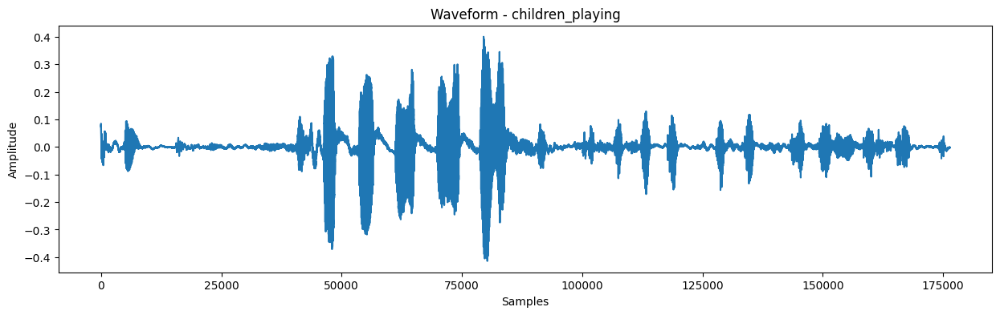

In [ ]:
plt.figure(figsize = (15, 4))

plt.plot(waveform_mono.numpy())

plt.title(f"Waveform - {sample['class']}")
plt.xlabel("Samples")
plt.ylabel("Amplitude")

plt.show()

waveform tells us:
- loudness: large peaks ```↑ ↑ ↑``` refering to more energy
- silence: flat regions ```-----```, refering to little sound


we should also note that some sounds are burst-like for example **_gun shot_**, **_dog bark_** and others are continuous like **_drilling_**, **_engine idling_**

### Listening to samples

if the audio were stereo `([2, samples])` we would use
``` Python
waveform.numpy().T
```
instead of
``` Python
waveform.numpy()
```

In [ ]:
from IPython.display import Audio, display

Audio(
    waveform.numpy(),  # convert tensor to numpy
    rate = sample_rate
)

In [ ]:
# listening to at least one sample of each class

idx = random.randint(0, len(dataset["train"]) - 1)

sample = dataset["train"][idx]

print("Class:", sample["class"])

decoded = sample["audio"].get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

Audio(waveform.numpy(), rate = sample_rate)

Class: jackhammer


In [ ]:
def listen_sample(dataset, idx):
    sample = dataset["train"][idx]

    print(f"Class: {sample['class']}")
    print(f"Fold: {sample['fold']}")

    decoded = sample["audio"].get_all_samples()

    waveform = decoded.data
    sample_rate = decoded.sample_rate

    display(Audio(waveform.numpy(), rate = sample_rate))

In [ ]:
listen_sample(dataset, 0)
listen_sample(dataset, 100)
listen_sample(dataset, 500)

Class: dog_bark
Fold: 5


Class: dog_bark
Fold: 4


Class: engine_idling
Fold: 3


In [ ]:
classes = dataset["train"].unique("class")

for cls in classes:
    idx = next(
        i for i, sample in enumerate(dataset["train"])
        if sample["class"] == cls
    )

    print(f"\nClass: {cls}")
    listen_sample(dataset, idx)


Class: dog_bark
Class: dog_bark
Fold: 5



Class: children_playing
Class: children_playing
Fold: 5



Class: car_horn
Class: car_horn
Fold: 10



Class: air_conditioner
Class: air_conditioner
Fold: 5



Class: street_music
Class: street_music
Fold: 7



Class: gun_shot
Class: gun_shot
Fold: 1



Class: siren
Class: siren
Fold: 7



Class: engine_idling
Class: engine_idling
Fold: 10



Class: jackhammer
Class: jackhammer
Fold: 1



Class: drilling
Class: drilling
Fold: 3


### Audio Duration Analysis

In [ ]:
metadata["duration"] = metadata["end"] - metadata["start"]

metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,duration
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,0.317551
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,4.000000
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,4.000000
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,4.000000
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,4.000000


In [ ]:
metadata["duration"].describe()

,duration
count,8732.000000
mean,3.607904
std,0.973570
min,0.054517
25%,4.000000
50%,4.000000
75%,4.000000
max,4.000000


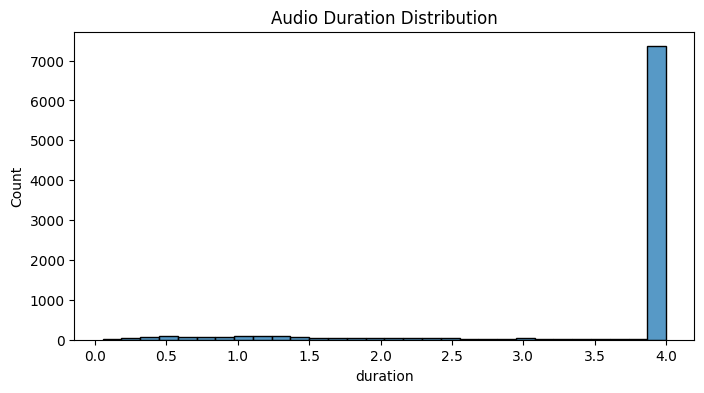

In [ ]:
# histogram

plt.figure(figsize = (8, 4))

sns.histplot(metadata["duration"], bins = 30)

plt.title("Audio Duration Distribution")

plt.show()

**Are clips all roughly four seconds?**

**YES**: Most UrbanSound8K audio clips have a duration of approximately 4 seconds. The median, 75th percentile, and maximum duration are all exactly 4.0 seconds, and the histogram shows a strong concentration at this value. However, a small number of clips are shorter, with durations ranging from approximately 0.05 to 4.0 seconds.

</br>

**Do we need padding later?**

**YES**: The duration analysis reveals that UrbanSound8K is largely standardized around 4-second audio clips. However, some recordings are significantly shorter, with durations as low as 0.05 seconds. Because deep learning models require fixed-size inputs, padding will be required during preprocessing to ensure all audio samples have the same length before feature extraction and model training.

Neural networks require inputs of consistent size. Since clip lengths vary, I will eventually need one of the following:

- **Padding** shorter clips with zeros
- **Truncating** longer clips (if any exceed the target length)
- Converting audio to fixed-size spectrograms

For UrbanSound8K, a common strategy is:
1. Converting stereo → mono
2. Resampling (e.g., 16 kHz)
3. Padding all clips to 4 seconds

### Spectrogram Visualization

this is where audio begins to resemble images

In [ ]:
from torchaudio.transforms import Spectrogram

In [ ]:
# creating spectrogram

transform = Spectrogram()

spec = transform(waveform_mono)

In [ ]:
print(f"spectrogram shape: {spec.shape}")
print(f"data type: {type(spec)}")

spectrogram shape: torch.Size([201, 883])
data type: <class 'torch.Tensor'>


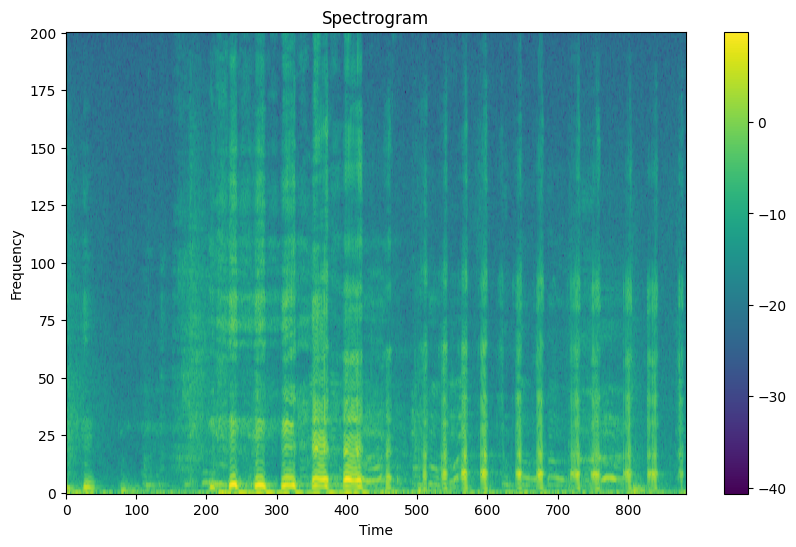

In [ ]:
plt.figure(figsize = (10, 6))

plt.imshow(
    spec.log2().numpy(),
    aspect = "auto",
    origin = "lower",
)

plt.xlabel("Time")
plt.ylabel("Frequency")

plt.title("Spectrogram")

plt.colorbar() # add a colorbar to a plot

plt.show()

horizontal axis: Time

vertical axis: Frequency

brigthness: Energy

</br>

This is the key idea behind Pipeline 1:
```
Audio (.wav)
    ↓
Spectrogram
    ↓
Image
    ↓
CNN
    ↓
Class prediction

### Comparing classes waveforms and spectrograms

example plot a figure having subplot of each classes and then visualize the waveforms and spectrograms and observe

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
        num_rows: 8732
    })
})

In [ ]:
# creating a helper function

def load_audio_by_class(class_name):
  idx = next(
      i for i, sample in enumerate(dataset["train"])
      if sample["class"] == class_name
  )

  sample = dataset["train"][idx]

  decoded = sample["audio"].get_all_samples()

  waveform = decoded.data
  sample_rate = decoded.sample_rate

  # converting stereo to mono
  waveform_mono = waveform.mean(dim = 0)

  return waveform_mono, sample_rate


In [ ]:
dataset["train"].unique("class")

['dog_bark',
 'children_playing',
 'car_horn',
 'air_conditioner',
 'street_music',
 'gun_shot',
 'siren',
 'engine_idling',
 'jackhammer',
 'drilling']

In [ ]:
# comparison
# i am choosing all the classes on one go,
# but i could have chosen four classes at the
# time

classes = [
  'dog_bark',
  'children_playing',
  'car_horn',
  'air_conditioner',
  'street_music',
  'gun_shot',
  'siren',
  'engine_idling',
  'jackhammer',
  'drilling'
]

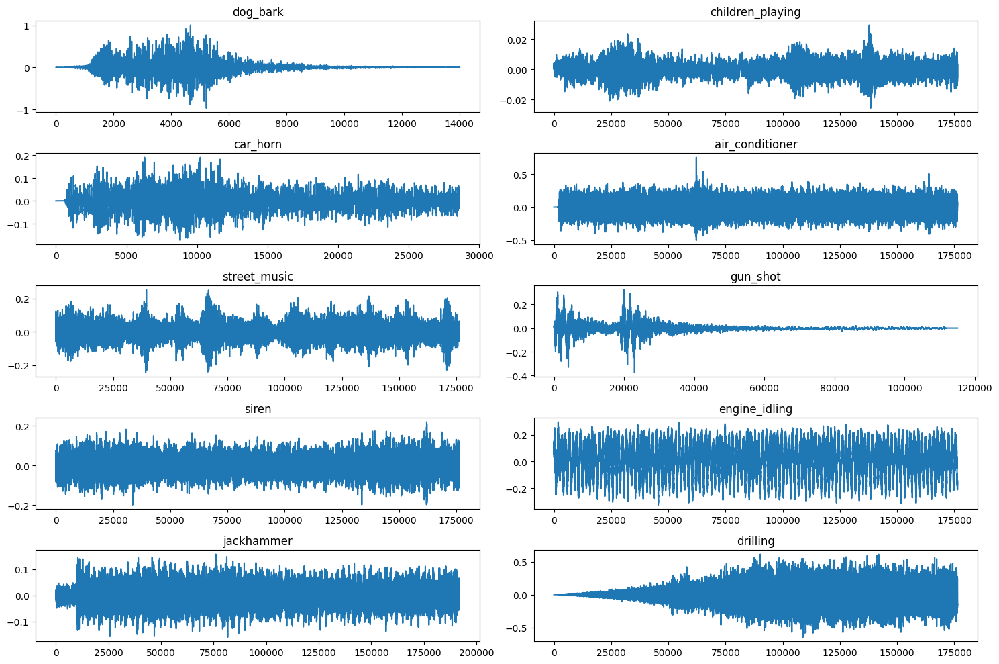

In [ ]:
# waveform comparisons

fig, axes = plt.subplots(len(classes)//2, 2, figsize = (15, 10))

for j in range(len(classes)//2):
  for i in range(2):
    idx = i + j*2

    class_name = classes[idx]

    waveform_mono, sample_rate = load_audio_by_class(class_name)

    axes[j, i].plot(waveform_mono.numpy())

    axes[j, i].set_title(class_name)


  ''' for i, class_name in enumerate(classes):
    waveform_mono, sample_rate = load_audio_by_class(class_name)

    axes[i].plot(waveform_mono.numpy())

    axes[i].set_title(class_name) '''

plt.tight_layout() # adjusting subplot padding to prevent overlapping titles, tick labels and axes labels

/usr/local/lib/python3.12/dist-packages/torchaudio/functional/functional.py:581: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


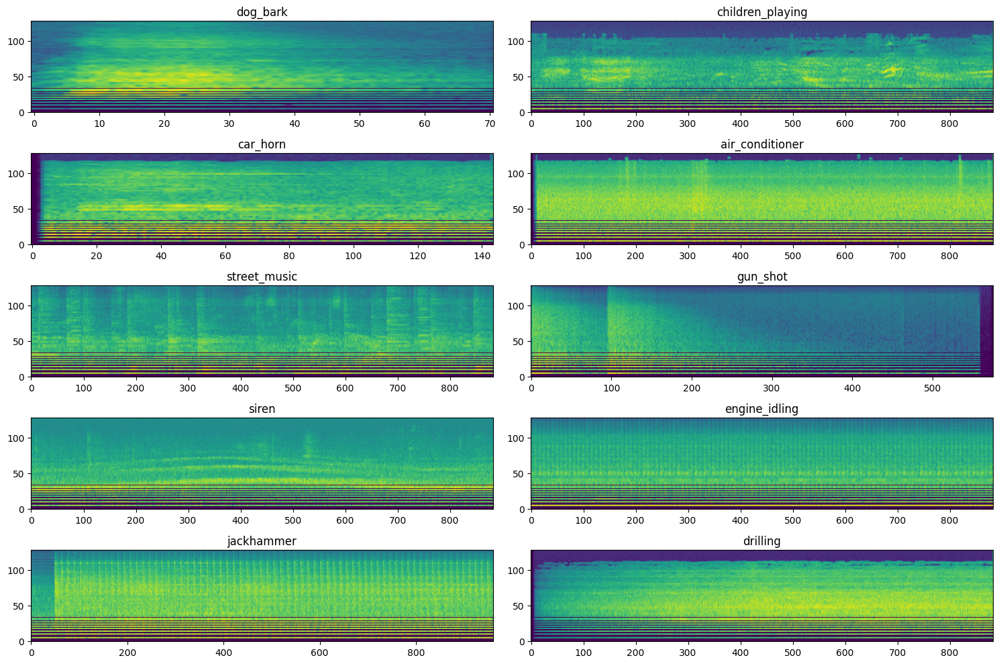

In [ ]:
# spectrogram comparisons
# we will use Mel spectrograms as for the pipeline 1 specifications

from torchaudio.transforms import MelSpectrogram


mel_transform = MelSpectrogram(
    sample_rate = sample_rate,
    n_mels = 128
)

fig, axes = plt.subplots(len(classes)//2, 2, figsize = (15, 10))

for j in range(len(classes)//2):
  for i in range(2):
    idx = i + j*2

    class_name = classes[idx]

    waveform_mono, sample_rate = load_audio_by_class(class_name)

    mel_spec = mel_transform(waveform_mono)

    axes[j, i].imshow(
        torch.log(mel_spec + 1e-9).numpy(),
        aspect = "auto",
        origin = "lower",
    )

    axes[j, i].set_title(class_name)

plt.tight_layout()

plt.show()

## Phase 3: Audio Preprocessing


**Why Preprocessing is Needed**

Unlike images, audio clips may have:
- Different lengths
- Different channels
- Different sampling rates
- Different amplitudes

Neural networks expect inputs of fixed dimensions, so preprocessing ensures consistency.

### Resampling Audio

making everything uniform

we will set the sample rate to `16000` because smaller tensors, faster training, widely used and it is good enough for environmental sounds

In [ ]:
sample = dataset["train"][0]

audio = sample["audio"]
decoded = audio.get_all_samples()

orig_waveform = decoded.data
orig_sample_rate = decoded.sample_rate

In [ ]:
# resampling audio
from torchaudio.transforms import Resample

TARGET_SAMPLE_RATE = 16000

resampler = Resample(
    orig_freq = orig_sample_rate,
    new_freq = TARGET_SAMPLE_RATE
)

# applying the resampling
new_waveform = resampler(orig_waveform)

print(f"original sample rate: {orig_sample_rate}")
print(f"new sample rate: {TARGET_SAMPLE_RATE}")
print(f"original waveform shape: {orig_waveform.shape}")
print(f"new waveform shape: {new_waveform.shape}")

original sample rate: 44100
new sample rate: 16000
original waveform shape: torch.Size([2, 14004])
new waveform shape: torch.Size([2, 5081])


### Stereo to Mono Conversion

In [ ]:
sample = dataset["train"][0]

audio = sample["audio"]
decoded = audio.get_all_samples()

stereo_waveform = decoded.data
sample_rate = decoded.sample_rate

In [ ]:
mono_waveform = stereo_waveform.mean(dim = 0, keepdim = True)

print(f"stereo waveform shape: {stereo_waveform.shape}")
print(f"mono waveform shape: {mono_waveform.shape}")

stereo waveform shape: torch.Size([2, 14004])
mono waveform shape: torch.Size([1, 14004])


### Audio Duration Analysis

In [ ]:
metadata["duration"] = metadata["end"] - metadata["start"]

metadata["duration"].describe()

,duration
count,8732.000000
mean,3.607904
std,0.973570
min,0.054517
25%,4.000000
50%,4.000000
75%,4.000000
max,4.000000


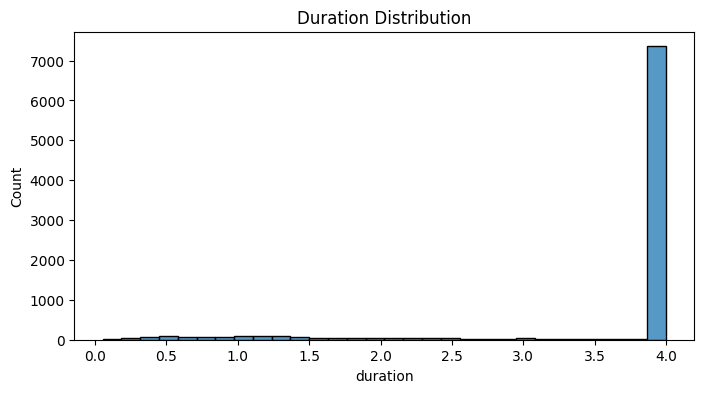

In [ ]:
plt.figure(figsize=(8,4))

sns.histplot(metadata["duration"], bins=30)

plt.title("Duration Distribution")
plt.show()

clips are roughly 4 seconds but still some are between 0.05 to 1.5 seconds

### Padding and Truncation

Neural networks require fixed-length input. so we will fix all clip to a target duration of `4` seconds

In [ ]:
TARGET_DURATION = 4
TARGET_NUM_SAMPLES = TARGET_DURATION * TARGET_SAMPLE_RATE

In [ ]:
TARGET_NUM_SAMPLES

64000

hence that is to make every audio tensor to contain `64000` samples

In [ ]:
sample = dataset["train"][0]

audio = sample["audio"]
decoded = audio.get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

In [ ]:
# padding: for short clips
# we will be compensating with zeros to in other
# to reach the target num samples

if waveform.shape[1] < TARGET_NUM_SAMPLES:
  padding = TARGET_NUM_SAMPLES - waveform.shape[1]

  waveform = torch.nn.functional.pad(
      waveform,
      (0, padding)
  )

In [ ]:
# Truncation: for long clips
# will be truncating a long clips in other
# to satisfy the target clip duration and num samples

waveform = waveform[:, :TARGET_NUM_SAMPLES]

### Amplitude Normalization

Different recordings have different loudness. we should normalize that so that values will be lying between `-1 and 1`

In [ ]:
sample = dataset["train"][0]

audio = sample["audio"]
decoded = audio.get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

In [ ]:
waveform

tensor([[-4.5776e-03, -4.8828e-03, -4.6082e-03,  ..., -5.7983e-04,
         -4.2725e-04,  3.0518e-05],
        [-4.5166e-03, -4.7913e-03, -4.6082e-03,  ..., -7.3242e-04,
         -5.4932e-04, -3.0518e-05]])

In [ ]:
waveform = waveform / waveform.abs().max()

In [ ]:
waveform.shape

torch.Size([2, 14004])

In [ ]:
waveform

tensor([[-4.5778e-03, -4.8830e-03, -4.6083e-03,  ..., -5.7985e-04,
         -4.2726e-04,  3.0519e-05],
        [-4.5167e-03, -4.7914e-03, -4.6083e-03,  ..., -7.3244e-04,
         -5.4933e-04, -3.0519e-05]])

### Building a Preprocessing Function

In [ ]:
TARGET_SAMPLE_RATE = 16000
TARGET_DURATION = 4
TARGET_NUM_SAMPLES = TARGET_SAMPLE_RATE * TARGET_DURATION

In [ ]:
def preprocess_audio(idx):

    sample = dataset["train"][idx]

    audio = sample["audio"]
    decoded = audio.get_all_samples()

    waveform = decoded.data
    sample_rate = decoded.sample_rate

    # stereo → mono
    waveform = waveform.mean(dim = 0, keepdim = True)

    # resample
    if sample_rate != TARGET_SAMPLE_RATE:

        resampler = torchaudio.transforms.Resample(
            sample_rate,
            TARGET_SAMPLE_RATE
        )

        waveform = resampler(waveform)

    # padding
    if waveform.shape[1] < TARGET_NUM_SAMPLES:

        padding = TARGET_NUM_SAMPLES - waveform.shape[1]

        waveform = torch.nn.functional.pad(
            waveform,
            (0, padding)
        )

    # truncation
    else:

        waveform = waveform[:, :TARGET_NUM_SAMPLES]

    # normalization
    waveform = waveform / waveform.abs().max()

    return waveform

In [ ]:
waveform = preprocess_audio(0)

print(f"waveform shape: {waveform.shape}")

waveform shape: torch.Size([1, 64000])


##Phase 4: Feature engineering

### why feature engineering?

we know that:
```
Image
Pixels
↓
CNN

Text
Tokens
↓
Transformer

Audio
?
↓
Model
```
raw waveforms are difficult for humans to interpret.

Feature engineering transforms:
```
Waveform
↓
Frequency information
↓
Image-like representation
↓
CNN
```

</br>

Overview of Feature Representation
```
Waveform
    ↓
Fourier Transform
    ↓
STFT
    ↓
Spectrogram
    ↓
Mel Scale
    ↓
Mel Spectrogram
    ↓
Log-Mel Spectrogram
    ↓
MFCC
```

### Fourier Transform

**Problem**:

Waveforms show amplitude over timer. But we also want to know: **Which frequencies are present?**

Fourier Transform converts:
```
Time Domain
↓
Frequency Domain
```

Example:

A sound may contain:
- 200 Hz
- 800 Hz
- 3000 Hz

The Fourier Transform reveals these frequencies.

</br>

**Limitation**:

It loses time information. It tells us: **What frequencies exist?** But not: **When do they occur?**



### Short-Time Fourier Transform (STFT)

STFT solves this problem. Instead of analyzing the whole signal: i.e entire audio
```
-------------------------
```

, it analyzes small windows:
```
|---|---|---|---|---|
```
each window gets its own Fourier Transform.


Thus: `Time + Frequency` become available simultaneously.

### Spectrogram

A spectrogram is simply the visualization of the STFT.

axes:
```
Frequency ↑
          |
          |
          |
          +----------------→ Time

Color intensity = Energy
```

### Mel Scale

Humans don't perceive frequencies linearly. We distinguish low frequencies much better than very high frequencies.

The Mel scale mimics human hearing. it compresses `High frequencies` and give more resolution to: `Low frequencies`.

### Mel Spectrogram

This is the most common representation for audio classification.

Pipeline:
```
Waveform
↓
STFT
↓
Power Spectrum
↓
Mel Scale
↓
Mel Spectrogram
```

### Why Mel spectrograms?

Because CNNs love images.
```
Waveform
↓
Mel Spectrogram
↓
Image
↓
CNN
↓
Classification
```
This will be the representation used by the Pipeline 1, which is:
```
Raw Audio
↓
Preprocessing
↓
Mel Spectrogram
↓
ResNet18
```

### Log-Mel Spectrogram

Raw Mel spectrograms have a huge dynamic range. some values dominate. Taking the logarithm compresses the range.

**Why Log?**

Human hearing itself behaves approximately logarithmically. Thus Log-Mel Spectrograms resemble human auditory perception even more.

This representation will later feed my Pipeline 3, which is:
```
Raw Audio
↓
Preprocessing
↓
Log-Mel Spectrogram
↓
Patch Extraction
↓
Audio Spectrogram Transformer
```

In [ ]:
TARGET_SAMPLE_RATE

16000

In [ ]:
from torchaudio.transforms import MelSpectrogram


mel_transform = MelSpectrogram(
    sample_rate = TARGET_SAMPLE_RATE,
    n_mels = 128
)

sample = dataset["train"][idx]

decoded = sample["audio"].get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

mel_spec = mel_transform(waveform)

print(f"waveform shape: {waveform.shape}")
print(f"mel spectrogram shape: {mel_spec.shape}")


waveform shape: torch.Size([2, 28600])
mel spectrogram shape: torch.Size([2, 128, 144])


/usr/local/lib/python3.12/dist-packages/torchaudio/functional/functional.py:581: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


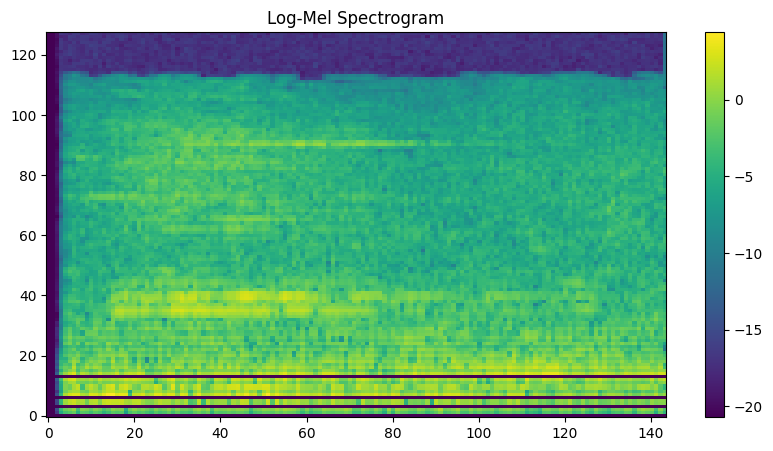

In [ ]:
log_mel_spec = torch.log(mel_spec + 1e-9)

plt.figure(figsize=(10,5))

plt.imshow(
    log_mel_spec[0].numpy(),
    aspect='auto',
    origin='lower'
)

plt.colorbar()

plt.title("Log-Mel Spectrogram")

plt.show()

In [ ]:
mel_spec.shape

torch.Size([2, 128, 144])

meaning:
- 128 Mel frequency bands
- 144 time frames

### Mel Frequency Cepstral Coefficients (MFCC)

historically used in:
- speech recognition
- speaker identification

Pipeline:
```
Waveform
↓
STFT
↓
Mel Scale
↓
Log
↓
DCT
↓
MFCC
```

In [ ]:
# generating MFCC

from torchaudio.transforms import MFCC

mfcc_transform = MFCC(
    sample_rate = TARGET_SAMPLE_RATE,
    n_mfcc = 40
)

sample = dataset["train"][idx]

decoded = sample["audio"].get_all_samples()

waveform = decoded.data
sample_rate = decoded.sample_rate

mfcc = mfcc_transform(waveform)

print(f"waveform shape: {waveform.shape}")
print(f"mfcc shape: {mfcc.shape}")

waveform shape: torch.Size([2, 28600])
mfcc shape: torch.Size([2, 40, 144])


/usr/local/lib/python3.12/dist-packages/torchaudio/functional/functional.py:581: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


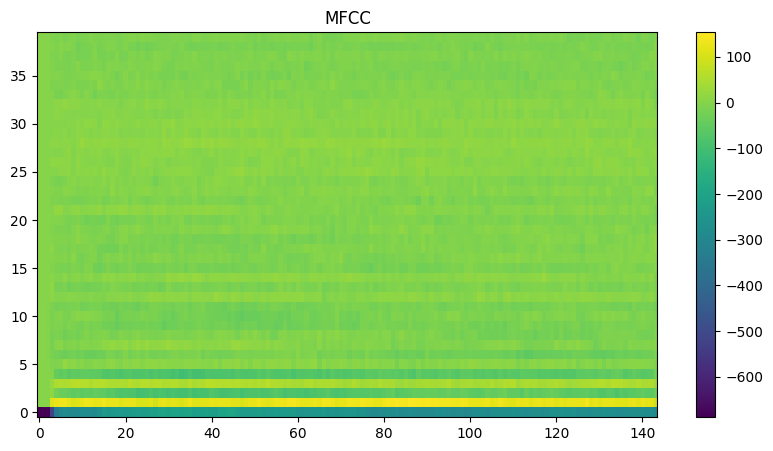

In [ ]:
plt.figure(figsize=(10,5))

plt.imshow(
    mfcc[0].numpy(),
    aspect='auto',
    origin='lower'
)

plt.colorbar()

plt.title("MFCC")

plt.show()

still for modern CNNs and Transformers: **Log-Mel Spectrograms are generally preferred over MFCC**

### Key Takeaways

- Fourier Transform reveals frequencies but loses temporal information.
- STFT adds time information.
- Spectrograms visualize frequency content over time.
- Mel Spectrograms approximate human hearing.
- Log-Mel Spectrograms are the standard input for modern audio models.
- MFCCs are classical hand-crafted features.
- Pipeline 1 will use Mel Spectrograms.
- Pipeline 3 will use Log-Mel Spectrograms.
- Pipeline 2 operates directly on waveforms.

##Phase 5: Pipeline 1: Vision-Based Audio Classification

###Pipeline Overview

our first complete pipeline is:
```
Raw Audio (.wav)
        ↓
Preprocessing
        ↓
Mel Spectrogram
        ↓
Simple CNN
        ↓
10 Classes
```
and then later:
```
Raw Audio
        ↓
Mel Spectrogram
        ↓
ResNet18
        ↓
10 Classes
```

Label Encoding

The model cannot understand: `"dog_bark"`, `"drilling"`, `"air_conditioner"` etc...It needs integers: like for example:

dog_bark -> 0

drilling -> 1

...

In [2]:
import torch
import torch.nn as nn

from torch.utils.data import (
    Dataset,
    DataLoader
)

from torchaudio.transforms import (
    MelSpectrogram,
    Resample
)

from datasets import (
    load_dataset,
    DatasetDict
)

from matplotlib import pyplot as plt

In [3]:
# importing and loading dataset
dataset = load_dataset("danavery/urbansound8k")

README.md:   0%|          | 0.00/5.66k [00:00<?, ?B/s]

data/train-00000-of-00016-e478d7cccca6a0(…): reconstructing file:   0%|          |  0.00B /  434MB            

data/train-00000-of-00016-e478d7cccca6a0(…): downloading bytes:           |  0.00B            

data/train-00001-of-00016-299138aa39afaa(…): reconstructing file:   0%|          |  0.00B /  472MB            

data/train-00001-of-00016-299138aa39afaa(…): downloading bytes:           |  0.00B            

data/train-00002-of-00016-887e0748205b6f(…): reconstructing file:   0%|          |  0.00B /  384MB            

data/train-00002-of-00016-887e0748205b6f(…): downloading bytes:           |  0.00B            

data/train-00003-of-00016-691ee48aa53d9c(…): reconstructing file:   0%|          |  0.00B /  447MB            

data/train-00003-of-00016-691ee48aa53d9c(…): downloading bytes:           |  0.00B            

data/train-00004-of-00016-c0f37514d8e28a(…): reconstructing file:   0%|          |  0.00B /  441MB            

data/train-00004-of-00016-c0f37514d8e28a(…): downloading bytes:           |  0.00B            

data/train-00005-of-00016-55ef1a0a51149c(…): reconstructing file:   0%|          |  0.00B /  591MB            

data/train-00005-of-00016-55ef1a0a51149c(…): downloading bytes:           |  0.00B            

data/train-00006-of-00016-0ef363072505e6(…): reconstructing file:   0%|          |  0.00B /  496MB            

data/train-00006-of-00016-0ef363072505e6(…): downloading bytes:           |  0.00B            

data/train-00007-of-00016-dfac173beb21e5(…): reconstructing file:   0%|          |  0.00B /  588MB            

data/train-00007-of-00016-dfac173beb21e5(…): downloading bytes:           |  0.00B            

data/train-00008-of-00016-2744487f32f65d(…): reconstructing file:   0%|          |  0.00B /  493MB            

data/train-00008-of-00016-2744487f32f65d(…): downloading bytes:           |  0.00B            

data/train-00009-of-00016-83fc7364d47981(…): reconstructing file:   0%|          |  0.00B /  549MB            

data/train-00009-of-00016-83fc7364d47981(…): downloading bytes:           |  0.00B            

data/train-00010-of-00016-4c1d0e285ed778(…): reconstructing file:   0%|          |  0.00B /  353MB            

data/train-00010-of-00016-4c1d0e285ed778(…): downloading bytes:           |  0.00B            

data/train-00011-of-00016-79d186503a2667(…): reconstructing file:   0%|          |  0.00B /  316MB            

data/train-00011-of-00016-79d186503a2667(…): downloading bytes:           |  0.00B            

data/train-00012-of-00016-6aff88fdcca229(…): reconstructing file:   0%|          |  0.00B /  372MB            

data/train-00012-of-00016-6aff88fdcca229(…): downloading bytes:           |  0.00B            

data/train-00013-of-00016-17d827b1a5be04(…): reconstructing file:   0%|          |  0.00B /  348MB            

data/train-00013-of-00016-17d827b1a5be04(…): downloading bytes:           |  0.00B            

data/train-00014-of-00016-c630762df85f6c(…): reconstructing file:   0%|          |  0.00B /  381MB            

data/train-00014-of-00016-c630762df85f6c(…): downloading bytes:           |  0.00B            

data/train-00015-of-00016-03506887d89adf(…): reconstructing file:   0%|          |  0.00B /  335MB            

data/train-00015-of-00016-03506887d89adf(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/8732 [00:00<?, ? examples/s]

In [7]:
len(dataset), type(dataset)

(1, datasets.dataset_dict.DatasetDict)

In [8]:
dataset["train"]

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 8732
})

In [9]:
dataset["train"]["class"]

Column(['dog_bark', 'children_playing', 'children_playing', 'children_playing', 'children_playing'])

In [10]:
len(dataset["train"])

8732

In [11]:
class_names = list(set(dataset["train"]["class"]))

class_names

['engine_idling',
 'siren',
 'gun_shot',
 'drilling',
 'car_horn',
 'children_playing',
 'street_music',
 'air_conditioner',
 'jackhammer',
 'dog_bark']

In [12]:
TARGET_SAMPLE_RATE = 16000

In [13]:
sorted(class_names)

['air_conditioner',
 'car_horn',
 'children_playing',
 'dog_bark',
 'drilling',
 'engine_idling',
 'gun_shot',
 'jackhammer',
 'siren',
 'street_music']

In [14]:
classes = sorted(class_names)

class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}

In [15]:
classes

['air_conditioner',
 'car_horn',
 'children_playing',
 'dog_bark',
 'drilling',
 'engine_idling',
 'gun_shot',
 'jackhammer',
 'siren',
 'street_music']

In [16]:
class_to_idx

{'air_conditioner': 0,
 'car_horn': 1,
 'children_playing': 2,
 'dog_bark': 3,
 'drilling': 4,
 'engine_idling': 5,
 'gun_shot': 6,
 'jackhammer': 7,
 'siren': 8,
 'street_music': 9}

In [17]:
idx_to_class

{0: 'air_conditioner',
 1: 'car_horn',
 2: 'children_playing',
 3: 'dog_bark',
 4: 'drilling',
 5: 'engine_idling',
 6: 'gun_shot',
 7: 'jackhammer',
 8: 'siren',
 9: 'street_music'}

In [18]:
# mel spectrogram transform
'''
n_fft: number of Fast Fourier Transform (FFT) components or window length
       used in audio processing libraries
hop_length: the number of audio samples between the start of two consecutive
            analysis windows (or frames) when computing a Short-Time Fourier
            Transform (STFT)
n_mels: refers to the number of Mel filter banks (or Mel bands) used to
        generate a Mel spectrogram
'''

mel_transform = MelSpectrogram(
    sample_rate = TARGET_SAMPLE_RATE,
    n_fft = 1024,
    hop_length = 512,
    n_mels = 128
)

In [19]:
# converting to Log-Mel

def waveform_to_log_mel(waveform):

  mel_spec = mel_transform(waveform)

  log_mel_spec = torch.log(mel_spec + 1e-9)

  return log_mel_spec

In [20]:
sample = dataset["train"][0]

sample

{'audio': <datasets.features._torchcodec.AudioDecoder at 0x7f4f93c9ec90>,
 'slice_file_name': '100032-3-0-0.wav',
 'fsID': 100032,
 'start': 0.0,
 'end': 0.317551,
 'salience': 1,
 'fold': 5,
 'classID': 3,
 'class': 'dog_bark'}

In [21]:
sample.keys()

dict_keys(['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'])

In [22]:
sample["audio"]

In [23]:
dir(sample["audio"])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_decoder',
 '_desired_sample_rate',
 '_hf_encoded',
 'get_all_samples',
 'get_samples_played_in_range',
 'metadata',
 'stream_index']

In [24]:
decoded = sample["audio"].get_all_samples()

decoded

AudioSamples:
  data (shape): torch.Size([2, 14004])
  pts_seconds: 0.0
  duration_seconds: 0.31755102040816324
  sample_rate: 44100

In [25]:
dir(decoded)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__class_getitem__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__post_init__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 'data',
 'duration_seconds',
 'pts_seconds',
 'sample_rate']

In [26]:
# train/validation split

split_dataset = dataset["train"].train_test_split(
    test_size = 0.2,
    seed = 42
)

train_dataset = split_dataset["train"]
val_dataset = split_dataset["test"]

In [27]:
train_dataset

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 6985
})

In [28]:
val_dataset

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 1747
})

In [29]:
print(f"train dataset size: {len(train_dataset)}")
print(f"validation dataset size: {len(val_dataset)}")

train dataset size: 6985
validation dataset size: 1747


In [30]:
# preprocessing function

def preprocess_waveform(waveform, sample_rate):

    TARGET_SAMPLE_RATE = 16000
    TARGET_DURATION = 4
    TARGET_NUM_SAMPLES = TARGET_SAMPLE_RATE * TARGET_DURATION

    # stereo → mono
    if waveform.shape[0] > 1:
        waveform = waveform.mean(dim = 0, keepdim = True)

    # resampling
    if sample_rate != TARGET_SAMPLE_RATE:

        resampler = Resample(
            sample_rate,
            TARGET_SAMPLE_RATE
        )

        waveform = resampler(waveform)

    # padding
    if waveform.shape[1] < TARGET_NUM_SAMPLES:

        padding = TARGET_NUM_SAMPLES - waveform.shape[1]

        waveform = torch.nn.functional.pad(
            waveform,
            (0, padding)
        )

    # truncation
    else:

        waveform = waveform[:, :TARGET_NUM_SAMPLES]

    # normalization
    waveform = waveform / waveform.abs().max()

    return waveform

In [31]:
class UrbanSoundDataset(Dataset):
  def __init__(self, hf_dataset, mel_transform):
    self.dataset = hf_dataset
    self.mel_transform = mel_transform

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):

    sample = self.dataset[idx]

    decoded = sample["audio"].get_all_samples()

    waveform = decoded.data
    sample_rate = decoded.sample_rate

    # preprocess
    waveform = preprocess_waveform(
        waveform,
        sample_rate
    )

    # mel spectrogram
    mel_spec = self.mel_transform(waveform)

    # log mel
    log_mel_spec = torch.log(mel_spec + 1e-9)

    # label: Convert string label to integer ID
    label = class_to_idx[sample["class"]]

    return log_mel_spec, label

In [32]:
# creating Dataset objects

pytorch_train_dataset = UrbanSoundDataset(
    train_dataset,
    mel_transform
)

pytorch_val_dataset = UrbanSoundDataset(
    val_dataset,
    mel_transform
)

In [33]:
pytorch_train_dataset, type(pytorch_train_dataset)

(<__main__.UrbanSoundDataset at 0x7f4f93b3f470>, __main__.UrbanSoundDataset)

In [34]:
pytorch_val_dataset, type(pytorch_val_dataset)

(<__main__.UrbanSoundDataset at 0x7f4f93b409e0>, __main__.UrbanSoundDataset)

In [35]:
len(pytorch_train_dataset), len(pytorch_val_dataset)

(6985, 1747)

In [36]:
print(f"train dataset size: {len(pytorch_train_dataset)}")
print(f"validation dataset size: {len(pytorch_val_dataset)}")

train dataset size: 6985
validation dataset size: 1747


In [33]:
# creating DataLoaders

BATCH_SIZE = 32

train_loader = DataLoader(
    pytorch_train_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True
)

val_loader = DataLoader(
    pytorch_val_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False
)

In [34]:
# inspecting batches

features, labels = next(iter(train_loader))

print(features.shape)
print(labels.shape)

torch.Size([32, 1, 128, 126])
torch.Size([32])


In [35]:
features.dim()

4

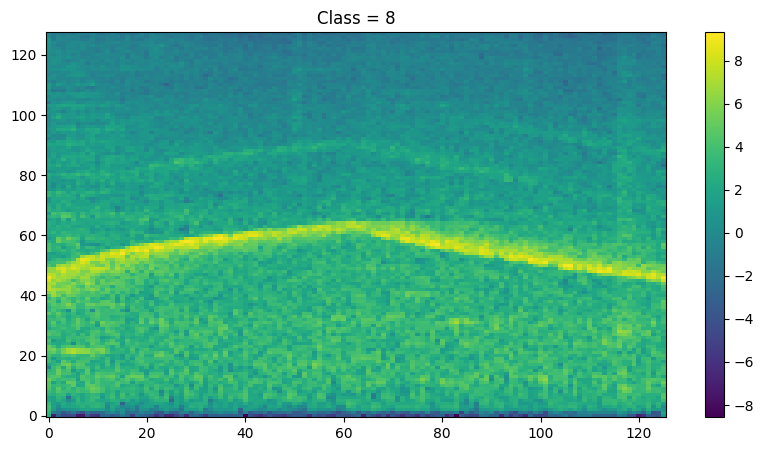

In [36]:
# visualizing samples

plt.figure(figsize = (10,5))

plt.imshow(
    features[0][0],
    origin = "lower",
    aspect = "auto"
)

plt.colorbar()

plt.title(f"Class = {labels[0]}")

plt.show()

In [37]:
# Building simple CNN
'''
Architecture:

Input [1,128,T]
T depends on your spectrogram parameters
      ↓
Conv Block 1
      ↓
Conv Block 2
      ↓
Conv Block 3
      ↓
Global Average Pooling
      ↓
Fully Connected
      ↓
10 Classes
'''

class SimpleAudioCNN(nn.Module):
  def __init__(self, num_classes = 10):

    super().__init__()

    self.features = nn.Sequential(
        nn.Conv2d(
            in_channels = 1,
            out_channels = 16,
            kernel_size = 3,
            padding = 1
        ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(
            in_channels = 16,
            out_channels = 32,
            kernel_size = 3,
            padding = 1
        ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(
            in_channels = 32,
            out_channels = 64,
            kernel_size = 3,
            padding = 1
        ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2)
    )

    self.global_pool = nn.AdaptiveAvgPool2d((1, 1))

    self.classifier = nn.Linear(64, num_classes)

  def forward(self, x):
    x = self.features(x)
    x = self.global_pool(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)

    return x

without `AdaptiveAvgPool` i would need to manually calculate: `64 x H x W` after all convolutions. Adaptive pooling guarantees `[batch, 64, 1, 1]` making the model more robust.

In [38]:
device = "cuda" if torch.cuda.is_available() else "cpu"

device

'cuda'

In [40]:
SimpleAudioCNN_model = SimpleAudioCNN(num_classes = 10).to(device)

print(SimpleAudioCNN_model)

SimpleAudioCNN(
  (features): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (global_pool): AdaptiveAvgPool2d(output_size=(1, 1))
  (classifier): Linear(in_features=64, out_features=10, bias=True)
)


In [41]:
# testing the forward pass before training

batch, labels = next(iter(train_loader))

batch = batch.to(device)

outputs = SimpleAudioCNN_model(batch)

print(outputs.shape)

torch.Size([32, 10])


`torch.Size([32, 10])` means:
- 32 samples
- 10 logits per sample

In [42]:
# loss function and optimizer

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(SimpleAudioCNN_model.parameters(), lr = 1e-3)

In [46]:
# training loop

def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0
    correct = 0
    total = 0

    for inputs, labels in loader:

        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        predictions = outputs.argmax(dim=1)

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

    epoch_loss = running_loss / len(loader)

    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [47]:
# validation loop

def validate(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0
    correct = 0
    total = 0

    with torch.inference_mode():

        for inputs, labels in loader:

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += loss.item()

            predictions = outputs.argmax(dim=1)

            correct += (
                predictions == labels
            ).sum().item()

            total += labels.size(0)

    epoch_loss = running_loss / len(loader)

    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [45]:
# training the model

num_epochs = 10

train_losses = []
val_losses = []

train_accs = []
val_accs = []

for epoch in range(num_epochs):

    train_loss, train_acc = train_one_epoch(
        SimpleAudioCNN_model,
        train_loader,
        criterion,
        optimizer,
        device
    )

    val_loss, val_acc = validate(
        SimpleAudioCNN_model,
        val_loader,
        criterion,
        device
    )

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(
        f"Epoch [{epoch+1}/{num_epochs}] "
        f"Train Loss: {train_loss:.4f} "
        f"Train Acc: {train_acc:.4f} "
        f"Val Loss: {val_loss:.4f} "
        f"Val Acc: {val_acc:.4f}"
    )

Epoch [1/10] Train Loss: 1.9037 Train Acc: 0.2769 Val Loss: 1.6827 Val Acc: 0.3686
Epoch [2/10] Train Loss: 1.5262 Train Acc: 0.4314 Val Loss: 1.3900 Val Acc: 0.4906
Epoch [3/10] Train Loss: 1.3481 Train Acc: 0.5118 Val Loss: 1.2668 Val Acc: 0.5604
Epoch [4/10] Train Loss: 1.2439 Train Acc: 0.5467 Val Loss: 1.1882 Val Acc: 0.5936
Epoch [5/10] Train Loss: 1.1316 Train Acc: 0.5973 Val Loss: 1.1046 Val Acc: 0.6073
Epoch [6/10] Train Loss: 1.0624 Train Acc: 0.6258 Val Loss: 1.0597 Val Acc: 0.6560
Epoch [7/10] Train Loss: 1.0127 Train Acc: 0.6485 Val Loss: 1.0275 Val Acc: 0.6428
Epoch [8/10] Train Loss: 0.9708 Train Acc: 0.6643 Val Loss: 1.0354 Val Acc: 0.6531
Epoch [9/10] Train Loss: 0.9120 Train Acc: 0.6941 Val Loss: 0.9336 Val Acc: 0.6846
Epoch [10/10] Train Loss: 0.8839 Train Acc: 0.6984 Val Loss: 0.9533 Val Acc: 0.6972


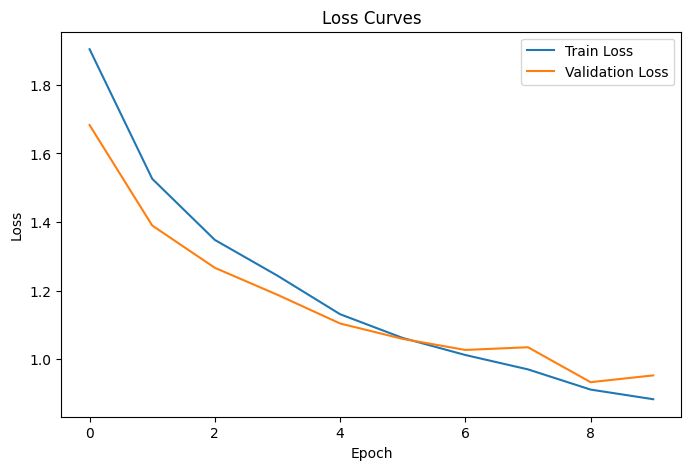

In [46]:
# loss curves

plt.figure(figsize = (8, 5))

plt.plot(train_losses, label = "Train Loss")
plt.plot(val_losses, label = "Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()

plt.title("Loss Curves")

plt.show()

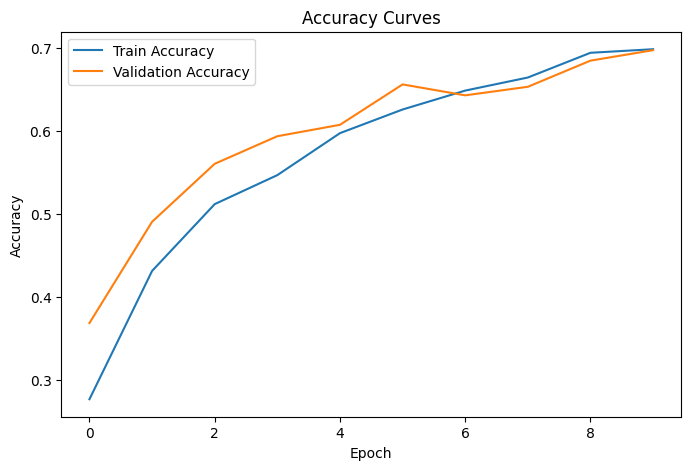

In [47]:
# accuracy curves

plt.figure(figsize = (8, 5))

plt.plot(train_accs, label = "Train Accuracy")
plt.plot(val_accs, label = "Validation Accuracy")

plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.legend()

plt.title("Accuracy Curves")

plt.show()

In [49]:
# evaluating model

SimpleAudioCNN_model.eval()

all_preds = []
all_labels = []

with torch.no_grad():

    for inputs, labels in val_loader:

        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = SimpleAudioCNN_model(inputs)

        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

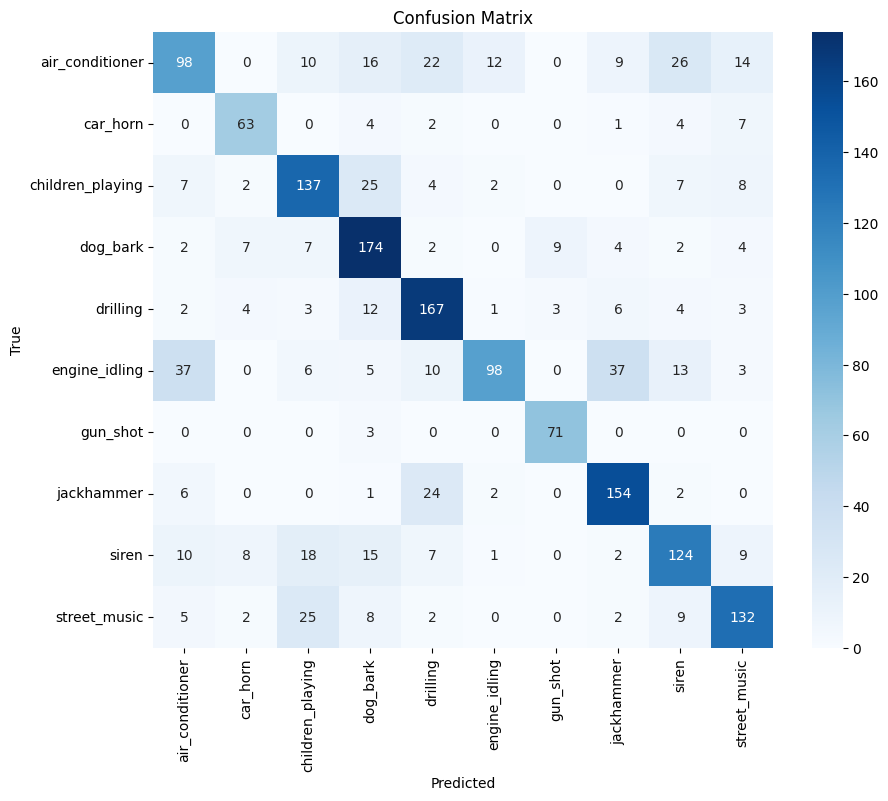

In [50]:
# confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns


cm = confusion_matrix(
    all_labels,
    all_preds
)

plt.figure(figsize = (10,8))

sns.heatmap(
    cm,
    annot = True,
    fmt = "d",
    cmap = "Blues",
    xticklabels = classes,
    yticklabels = classes
)

plt.xlabel("Predicted")
plt.ylabel("True")

plt.title("Confusion Matrix")

plt.show()

Interpretation is about answering to:
- which classes are easy?
- which classes are confused?

In [51]:
# classification report

from sklearn.metrics import classification_report


print(
    classification_report(
        all_labels,
        all_preds,
        target_names = classes
    )
)

                  precision    recall  f1-score   support

 air_conditioner       0.59      0.47      0.52       207
        car_horn       0.73      0.78      0.75        81
children_playing       0.67      0.71      0.69       192
        dog_bark       0.66      0.82      0.73       211
        drilling       0.70      0.81      0.75       205
   engine_idling       0.84      0.47      0.60       209
        gun_shot       0.86      0.96      0.90        74
      jackhammer       0.72      0.81      0.76       189
           siren       0.65      0.64      0.64       194
    street_music       0.73      0.71      0.72       185

        accuracy                           0.70      1747
       macro avg       0.71      0.72      0.71      1747
    weighted avg       0.70      0.70      0.69      1747



In [52]:
# error analysis

misclassified = []

with torch.no_grad():

    for inputs, labels in val_loader:

        outputs = SimpleAudioCNN_model(inputs.to(device))

        preds = outputs.argmax(dim=1)

        for i in range(len(labels)):

            if preds[i].cpu() != labels[i]:

                misclassified.append(
                    (
                        inputs[i],
                        labels[i],
                        preds[i].cpu()
                    )
                )

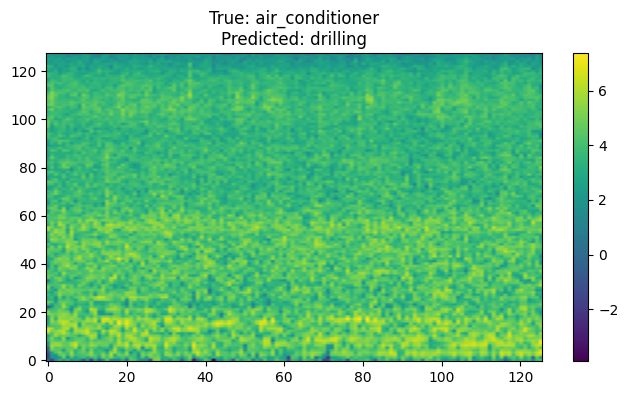

In [53]:
# visualization

sample, true_label, pred_label = misclassified[0]

plt.figure(figsize=(8,4))

plt.imshow(
    sample[0],
    aspect="auto",
    origin="lower"
)

plt.colorbar()

plt.title(
    f"True: {idx_to_class[true_label.item()]}\n"
    f"Predicted: {idx_to_class[pred_label.item()]}"
)

plt.show()

why did the model fail?

Are two classes acoustically similar?

is the sound noisy?

In [54]:
save_path = "SimpleAudioCNN_model.pth"

torch.save(SimpleAudioCNN_model.state_dict(), save_path)

### With Resnet8: Transfering Learning

ResNet18 expects 3 channels `[batch_size, 3, H, W]` while the Mel spectrograms are `[batch_size, 1, 128, 126]`.

In [37]:
from torchvision.models import resnet18
from torchvision.models import ResNet18_Weights
import torch.nn as nn

In [38]:
device = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)

print(device)

cuda


In [39]:
BATCH_SIZE = 64

train_loader = DataLoader(
    pytorch_train_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True,
    num_workers = 2,
    pin_memory = True
)

val_loader = DataLoader(
    pytorch_val_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False,
    num_workers = 2,
    pin_memory = True
)

In [40]:
def get_resnet18_model(num_classes):

    # Load pretrained weights
    model = resnet18(
        weights = ResNet18_Weights.DEFAULT
    )

    # Adapt to 1-channel spectrograms
    model.conv1 = nn.Conv2d(
        in_channels=1,
        out_channels=64,
        kernel_size=3,
        stride=1,
        padding=1,
        bias=False
    )

    # Preserve spatial resolution
    # model.maxpool = nn.Identity() # removing this line

    # Replace classifier
    num_features = model.fc.in_features

    model.fc = nn.Linear(
        num_features,
        num_classes
    )

    return model

In [41]:
Resnet_model = get_resnet18_model(num_classes = 10).to(device)

# Freeze all pretrained layers
for param in Resnet_model.parameters():
    param.requires_grad = False

# Unfreeze only the classifier layer
for param in Resnet_model.fc.parameters():
    param.requires_grad = True

print(Resnet_model)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 212MB/s]


ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [42]:
features, labels = next(iter(train_loader))

features = features.to(device)

outputs = Resnet_model(features)

print(outputs.shape)

torch.Size([64, 10])


In [43]:
# loss function
criterion = nn.CrossEntropyLoss()

# optimizer trains ONLY the classifier
optimizer = torch.optim.Adam(
    Resnet_model.fc.parameters(),
    lr = 1e-3
)

In [48]:
def training(
        epochs,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        device):

    train_losses = []
    val_losses = []

    train_accs = []
    val_accs = []

    best_val_acc = 0

    for epoch in range(epochs):

        train_loss, train_acc = train_one_epoch(
            model,
            train_loader,
            criterion,
            optimizer,
            device
        )

        val_loss, val_acc = validate(
            model,
            val_loader,
            criterion,
            device
        )

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        train_accs.append(train_acc)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:

            best_val_acc = val_acc

            torch.save(
                model.state_dict(),
                "best_model.pth"
            )

        print(
            f"Epoch [{epoch+1}/{epochs}] "
            f"Train Loss: {train_loss:.4f} "
            f"Train Acc: {train_acc:.4f} "
            f"Val Loss: {val_loss:.4f} "
            f"Val Acc: {val_acc:.4f}"
        )

    history = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accs": train_accs,
        "val_accs": val_accs
    }

    return history

In [49]:
# training the model

num_epochs = 10

history = training(
    num_epochs,
    Resnet_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device
)

Epoch [1/10] Train Loss: 1.6861 Train Acc: 0.4147 Val Loss: 1.3687 Val Acc: 0.5472
Epoch [2/10] Train Loss: 1.2619 Train Acc: 0.5857 Val Loss: 1.2021 Val Acc: 0.6033
Epoch [3/10] Train Loss: 1.1229 Train Acc: 0.6339 Val Loss: 1.1172 Val Acc: 0.6193
Epoch [4/10] Train Loss: 1.0294 Train Acc: 0.6637 Val Loss: 1.0329 Val Acc: 0.6571
Epoch [5/10] Train Loss: 0.9773 Train Acc: 0.6796 Val Loss: 1.0130 Val Acc: 0.6508
Epoch [6/10] Train Loss: 0.9292 Train Acc: 0.6976 Val Loss: 0.9714 Val Acc: 0.6777
Epoch [7/10] Train Loss: 0.9078 Train Acc: 0.7055 Val Loss: 0.9386 Val Acc: 0.6857
Epoch [8/10] Train Loss: 0.8810 Train Acc: 0.7108 Val Loss: 0.9243 Val Acc: 0.7058
Epoch [9/10] Train Loss: 0.8518 Train Acc: 0.7187 Val Loss: 0.9048 Val Acc: 0.7035
Epoch [10/10] Train Loss: 0.8259 Train Acc: 0.7246 Val Loss: 0.9115 Val Acc: 0.6938


In [50]:
history

{'train_losses': [1.686102510582317,
  1.2618665597655556,
  1.1228802800178528,
  1.0294072432951493,
  0.9772792355580764,
  0.9292102466930042,
  0.907754061980681,
  0.8810375029390508,
  0.851847277988087,
  0.8258961000225761],
 'val_losses': [1.3687477793012346,
  1.2021056009190423,
  1.1171525482620512,
  1.0328724746193205,
  1.0129753989832742,
  0.9714387314660209,
  0.9386176594666072,
  0.9243287380252566,
  0.9047735418592181,
  0.9115008520228522],
 'train_accs': [0.4147458840372226,
  0.5856836077308518,
  0.6339298496778811,
  0.6637079455977094,
  0.6795991410164639,
  0.6976377952755906,
  0.705511811023622,
  0.7108088761632069,
  0.7186828919112384,
  0.7245526127415891],
 'val_accs': [0.5472238122495707,
  0.6033199771036062,
  0.6193474527761877,
  0.6571265025758443,
  0.6508299942759015,
  0.6777332570120206,
  0.6857469948483114,
  0.7057813394390383,
  0.7034917000572409,
  0.6937607326846021]}

In [51]:
save_path = "FrozenResnet_model.pth"

torch.save(Resnet_model.state_dict(), save_path)

In [54]:
# Unfreezing for fine-tuning the entire network

UnfrozenResnet_model = get_resnet18_model(num_classes = 10).to(device)

for param in UnfrozenResnet_model.parameters():
    param.requires_grad = True

print(UnfrozenResnet_model)

ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [55]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(
    UnfrozenResnet_model.parameters(),
    lr=1e-5
)

In [56]:
# training the model

num_epochs = 10

history = training(
    num_epochs,
    UnfrozenResnet_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device
)

Epoch [1/10] Train Loss: 1.6802 Train Acc: 0.4520 Val Loss: 1.2412 Val Acc: 0.6428
Epoch [2/10] Train Loss: 1.0107 Train Acc: 0.7280 Val Loss: 0.8568 Val Acc: 0.7607
Epoch [3/10] Train Loss: 0.7120 Train Acc: 0.8180 Val Loss: 0.6586 Val Acc: 0.8191
Epoch [4/10] Train Loss: 0.5273 Train Acc: 0.8667 Val Loss: 0.5390 Val Acc: 0.8483
Epoch [5/10] Train Loss: 0.4129 Train Acc: 0.8974 Val Loss: 0.4571 Val Acc: 0.8735
Epoch [6/10] Train Loss: 0.3330 Train Acc: 0.9214 Val Loss: 0.4048 Val Acc: 0.8786
Epoch [7/10] Train Loss: 0.2668 Train Acc: 0.9341 Val Loss: 0.3709 Val Acc: 0.8872
Epoch [8/10] Train Loss: 0.2174 Train Acc: 0.9536 Val Loss: 0.3316 Val Acc: 0.9038
Epoch [9/10] Train Loss: 0.1766 Train Acc: 0.9613 Val Loss: 0.3047 Val Acc: 0.9101
Epoch [10/10] Train Loss: 0.1457 Train Acc: 0.9731 Val Loss: 0.3084 Val Acc: 0.9084


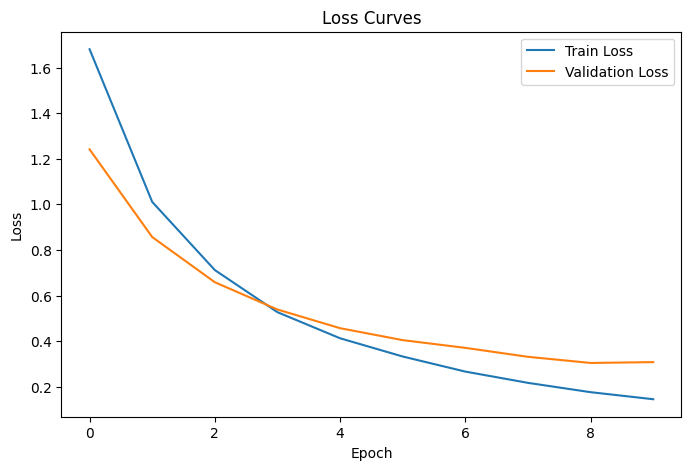

In [57]:
# loss curves

plt.figure(figsize = (8, 5))

plt.plot(history["train_losses"], label = "Train Loss")
plt.plot(history["val_losses"], label = "Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()

plt.title("Loss Curves")

plt.show()

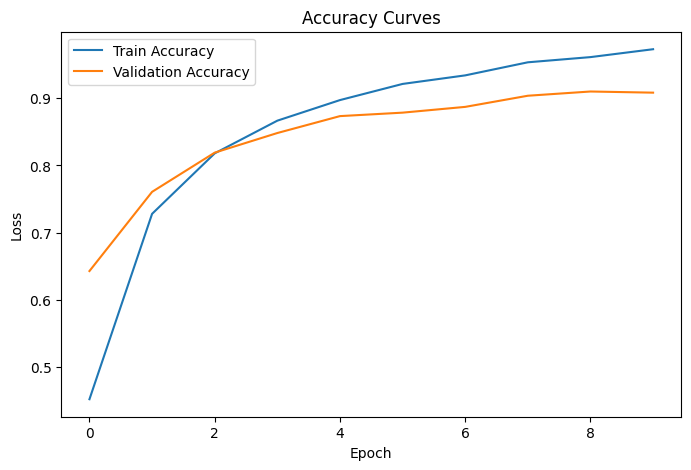

In [58]:
# accuracy curves

plt.figure(figsize = (8, 5))

plt.plot(history["train_accs"], label = "Train Accuracy")
plt.plot(history["val_accs"], label = "Validation Accuracy")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()

plt.title("Accuracy Curves")

plt.show()

In [59]:
# evaluating model

UnfrozenResnet_model.eval()

all_preds = []
all_labels = []

with torch.no_grad():

    for inputs, labels in val_loader:

        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = UnfrozenResnet_model(inputs)

        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

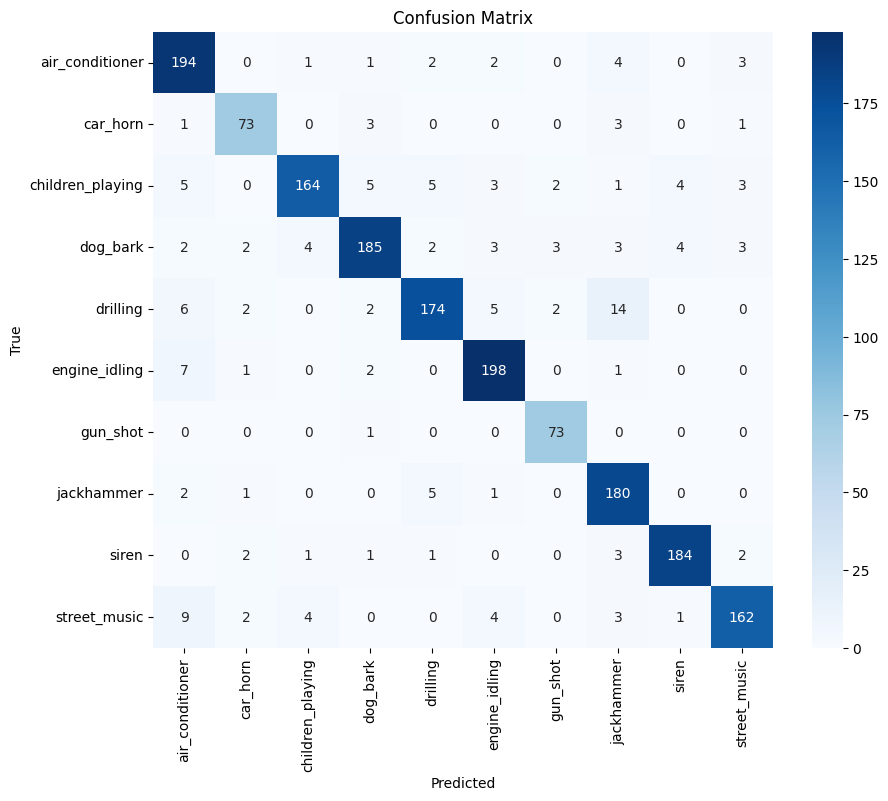

In [60]:
# confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns


cm = confusion_matrix(
    all_labels,
    all_preds
)

plt.figure(figsize = (10,8))

sns.heatmap(
    cm,
    annot = True,
    fmt = "d",
    cmap = "Blues",
    xticklabels = classes,
    yticklabels = classes
)

plt.xlabel("Predicted")
plt.ylabel("True")

plt.title("Confusion Matrix")

plt.show()

In [61]:
# classification report

from sklearn.metrics import classification_report


print(
    classification_report(
        all_labels,
        all_preds,
        target_names = classes
    )
)

                  precision    recall  f1-score   support

 air_conditioner       0.86      0.94      0.90       207
        car_horn       0.88      0.90      0.89        81
children_playing       0.94      0.85      0.90       192
        dog_bark       0.93      0.88      0.90       211
        drilling       0.92      0.85      0.88       205
   engine_idling       0.92      0.95      0.93       209
        gun_shot       0.91      0.99      0.95        74
      jackhammer       0.85      0.95      0.90       189
           siren       0.95      0.95      0.95       194
    street_music       0.93      0.88      0.90       185

        accuracy                           0.91      1747
       macro avg       0.91      0.91      0.91      1747
    weighted avg       0.91      0.91      0.91      1747



In [62]:
# error analysis

misclassified = []

with torch.no_grad():

    for inputs, labels in val_loader:

        outputs = UnfrozenResnet_model(inputs.to(device))

        preds = outputs.argmax(dim=1)

        for i in range(len(labels)):

            if preds[i].cpu() != labels[i]:

                misclassified.append(
                    (
                        inputs[i],
                        labels[i],
                        preds[i].cpu()
                    )
                )

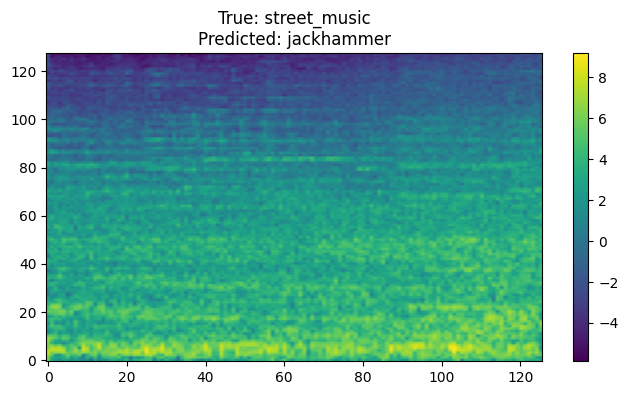

In [63]:
# visualization

sample, true_label, pred_label = misclassified[0]

plt.figure(figsize=(8,4))

plt.imshow(
    sample[0],
    aspect="auto",
    origin="lower"
)

plt.colorbar()

plt.title(
    f"True: {idx_to_class[true_label.item()]}\n"
    f"Predicted: {idx_to_class[pred_label.item()]}"
)

plt.show()

In [64]:
save_path = "UnfrozenResnet_model.pth"

torch.save(Resnet_model.state_dict(), save_path)

## Phase 6: Pipeline 2: Raw Waveform Classification (M5 CNN)

Unlike Pipeline 1, where we transformed audio into images (Mel spectrograms), this pipeline feeds the raw waveform directly into a neural network.

The objective is to compare:

| Pipeline 1                 | Pipeline 2               |
| -------------------------- | ------------------------ |
| Input: Log-Mel Spectrogram | Input: Raw Waveform      |
| 2D Convolutions            | 1D Convolutions          |
| ResNet18                   | M5 CNN                   |
| Learns spatial patterns    | Learns temporal patterns |

By the end, we'll compare:
- Accuracy
- Training speed
- Number of parameters
- Memory usage
- Advantages and disadvantages


### M5 Architecture

M5 is one of the classic baseline architectures for audio classification introduced in PyTorch's audio examples.

```
Raw waveform
      │
      ▼
    Conv1D
      │
      ▼
    ReLU
      │
      ▼
    MaxPool
      │
      ▼
    Conv1D
      │
      ▼
    ReLU
      │
      ▼
    MaxPool
      │
      ▼
    Conv1D
      │
      ▼
    ReLU
      │
      ▼
    MaxPool
      │
      ▼
    Conv1D
      │
      ▼
    ReLU
      │
      ▼
Global Average Pool
      │
      ▼
    Linear
      │
      ▼
10 Classes
```

### Why 1D Convolution ?
In images, the CNN slides across height and width.

In audio, there is only one spatial dimension: time.

Therefore:
- Image → Conv2D
- Audio waveform → Conv1D

**Important note**:

We will not reuse UrbanSoundDataset because it returns a log mel spec,
our M5 expects a waveform. So we will build a new Data class

```
UrbanSoundWaveformDataset
        ↓
  Decode audio
        ↓
    Preprocess
        ↓
  Return waveform
        ↓
  Return label
```

In [65]:
import torch
import torch.nn as nn

from torch.utils.data import (
    Dataset,
    DataLoader
)

from torchaudio.transforms import (
    Resample
)

from datasets import (
    load_dataset,
    DatasetDict
)

from matplotlib import pyplot as plt

In [ ]:
dataset = load_dataset("danavery/urbansound8k")

In [66]:
len(dataset), type(dataset)

(1, datasets.dataset_dict.DatasetDict)

In [67]:
dataset["train"]

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 8732
})

In [68]:
dataset["train"]["class"]

Column(['dog_bark', 'children_playing', 'children_playing', 'children_playing', 'children_playing'])

In [69]:
len(dataset["train"])

8732

In [70]:
class_names = list(set(dataset["train"]["class"]))

class_names

['engine_idling',
 'siren',
 'gun_shot',
 'drilling',
 'car_horn',
 'children_playing',
 'street_music',
 'air_conditioner',
 'jackhammer',
 'dog_bark']

In [71]:
TARGET_SAMPLE_RATE = 16000

In [72]:
sorted(class_names)

['air_conditioner',
 'car_horn',
 'children_playing',
 'dog_bark',
 'drilling',
 'engine_idling',
 'gun_shot',
 'jackhammer',
 'siren',
 'street_music']

In [73]:
classes = sorted(class_names)

class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}

In [74]:
classes

['air_conditioner',
 'car_horn',
 'children_playing',
 'dog_bark',
 'drilling',
 'engine_idling',
 'gun_shot',
 'jackhammer',
 'siren',
 'street_music']

In [75]:
class_to_idx

{'air_conditioner': 0,
 'car_horn': 1,
 'children_playing': 2,
 'dog_bark': 3,
 'drilling': 4,
 'engine_idling': 5,
 'gun_shot': 6,
 'jackhammer': 7,
 'siren': 8,
 'street_music': 9}

In [76]:
idx_to_class

{0: 'air_conditioner',
 1: 'car_horn',
 2: 'children_playing',
 3: 'dog_bark',
 4: 'drilling',
 5: 'engine_idling',
 6: 'gun_shot',
 7: 'jackhammer',
 8: 'siren',
 9: 'street_music'}

In [77]:
sample = dataset["train"][0]

sample

{'audio': <datasets.features._torchcodec.AudioDecoder at 0x7f4cd583ca40>,
 'slice_file_name': '100032-3-0-0.wav',
 'fsID': 100032,
 'start': 0.0,
 'end': 0.317551,
 'salience': 1,
 'fold': 5,
 'classID': 3,
 'class': 'dog_bark'}

In [78]:
sample.keys()

dict_keys(['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'])

In [79]:
sample["audio"]

In [80]:
dir(sample["audio"])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_decoder',
 '_desired_sample_rate',
 '_hf_encoded',
 'get_all_samples',
 'get_samples_played_in_range',
 'metadata',
 'stream_index']

In [81]:
decoded = sample["audio"].get_all_samples()

decoded

AudioSamples:
  data (shape): torch.Size([2, 14004])
  pts_seconds: 0.0
  duration_seconds: 0.31755102040816324
  sample_rate: 44100

In [82]:
dir(decoded)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__class_getitem__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__post_init__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 'data',
 'duration_seconds',
 'pts_seconds',
 'sample_rate']

In [83]:
split_dataset = dataset["train"].train_test_split(
    test_size = 0.2,
    seed = 42
)

train_dataset = split_dataset["train"]
val_dataset = split_dataset["test"]

In [84]:
train_dataset

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 6985
})

In [85]:
val_dataset

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 1747
})

In [86]:
print(f"train dataset size: {len(train_dataset)}")
print(f"validation dataset size: {len(val_dataset)}")

train dataset size: 6985
validation dataset size: 1747


In [87]:
# preprocessing function

def preprocess_waveform(waveform, sample_rate):

    TARGET_SAMPLE_RATE = 16000
    TARGET_DURATION = 4
    TARGET_NUM_SAMPLES = TARGET_SAMPLE_RATE * TARGET_DURATION

    # stereo → mono
    if waveform.shape[0] > 1:
        waveform = waveform.mean(dim = 0, keepdim = True)

    # resampling
    if sample_rate != TARGET_SAMPLE_RATE:

        resampler = Resample(
            sample_rate,
            TARGET_SAMPLE_RATE
        )

        waveform = resampler(waveform)

    # padding
    if waveform.shape[1] < TARGET_NUM_SAMPLES:

        padding = TARGET_NUM_SAMPLES - waveform.shape[1]

        waveform = torch.nn.functional.pad(
            waveform,
            (0, padding)
        )

    # truncation
    else:

        waveform = waveform[:, :TARGET_NUM_SAMPLES]

    # normalization
    waveform = waveform / waveform.abs().max()

    return waveform

In [88]:
# building the waveform Dataset
'''
Our objective is to create a PyTorch Dataset that returns raw waveforms
instead of spectrograms.
'''

class UrbanSoundWaveformDataset(Dataset):

    def __init__(self, hf_dataset):
        self.dataset = hf_dataset

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):

        # Retrieve one sample
        sample = self.dataset[idx]

        # Decode the audio
        decoded = sample["audio"].get_all_samples()

        waveform = decoded.data
        sample_rate = decoded.sample_rate

        # Preprocess
        waveform = preprocess_waveform(
            waveform,
            sample_rate
        )

        # Convert class name to integer
        label = class_to_idx[sample["class"]]

        return waveform, label

In [89]:
# creating data Dataset objects

waveform_train_dataset = UrbanSoundWaveformDataset(
    train_dataset
)

waveform_val_dataset = UrbanSoundWaveformDataset(
    val_dataset
)

In [90]:
print(len(waveform_train_dataset))
print(len(waveform_val_dataset))

6985
1747


In [91]:
# inspecting one example

waveform, label = waveform_train_dataset[0]

print(waveform.shape)
print(label)

torch.Size([1, 64000])
8


In [92]:
# creating DataLoaders

BATCH_SIZE = 64

waveform_train_loader = DataLoader(
    waveform_train_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True,
    num_workers = 2,
    pin_memory = True
)

waveform_val_loader = DataLoader(
    waveform_val_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False,
    num_workers = 2,
    pin_memory = True
)

In [93]:
print(len(waveform_train_loader))
print(len(waveform_val_loader))

110
28


In [94]:
# inspecting one batch

waveforms, labels = next(iter(waveform_train_loader))

print("Waveforms:", waveforms.shape)
print("Labels:", labels.shape)

Waveforms: torch.Size([64, 1, 64000])
Labels: torch.Size([64])


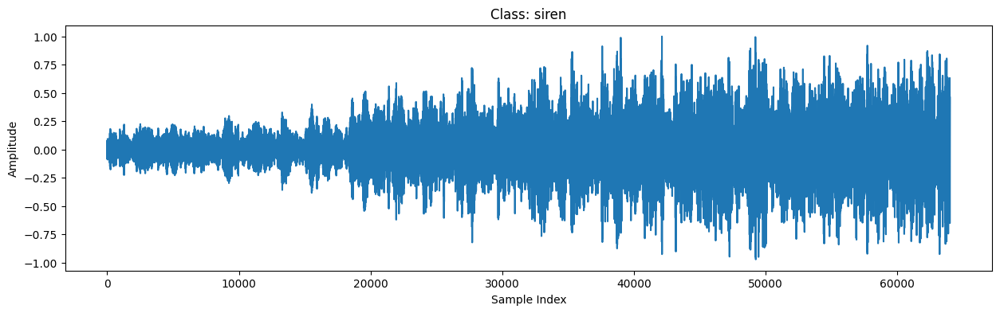

In [95]:
# visualizing a waveform

waveform, label = waveform_train_dataset[0]

plt.figure(figsize = (15, 4))

plt.plot(waveform.squeeze()) # we squeeze because plt expects 1D array for plotting

plt.title(f"Class: {idx_to_class[label]}")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")

plt.show()

Building M5 model:

For images we often use `3 x 3`. For audio, kernels are one-dimensional. We will use `80` because At 16 kHz, 80 samples correspond to 80/16000 = 0.005 seconds so around 5 ms. **That lets the network observe tiny sound patterns.**

We will use `Batch Normalization` to helps:
- stabilize training
- allow larger learning rates
- reduce internal covariate shift
- speed convergence

We will set stride to `4` so that instead of sliding one sample at a time, it will jump 4 samples at a time. This makes training much faster.

In [96]:
# building M5 model

class M5(nn.Module):

    def __init__(self, num_classes = 10):
        super().__init__()

        self.features = nn.Sequential(

            nn.Conv1d(
                in_channels = 1,
                out_channels = 32,
                kernel_size = 80,
                stride = 4
            ),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(4),

            nn.Conv1d(
                32,
                64,
                kernel_size = 3
            ),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(4),

            nn.Conv1d(
                64,
                128,
                kernel_size = 3
            ),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(4),

            nn.Conv1d(
                128,
                256,
                kernel_size = 3
            ),
            nn.BatchNorm1d(256),
            nn.ReLU()
        )

        self.global_pool = nn.AdaptiveAvgPool1d(1)

        self.classifier = nn.Linear(
            256,
            num_classes
        )

    def forward(self, x):

        x = self.features(x)

        x = self.global_pool(x)

        x = x.squeeze(-1) # the linear layer expect [64, 256] not [64, 256, 1] so we remove the last 1

        x = self.classifier(x)

        return x

In [97]:
# creating the model

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

m5_model = M5(
    num_classes = 10
).to(device)

print(m5_model)

M5(
  (features): Sequential(
    (0): Conv1d(1, 32, kernel_size=(80,), stride=(4,))
    (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (4): Conv1d(32, 64, kernel_size=(3,), stride=(1,))
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (8): Conv1d(64, 128, kernel_size=(3,), stride=(1,))
    (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (12): Conv1d(128, 256, kernel_size=(3,), stride=(1,))
    (13): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
  )
  (global_pool): AdaptiveAvgPool1d(output_size=1)
  (classifier)

In [98]:
# forward pass test

waveforms, labels = next(iter(waveform_train_loader))

waveforms = waveforms.to(device)

outputs = m5_model(waveforms)

print(outputs.shape)

torch.Size([64, 10])


In [99]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(
    m5_model.parameters(),
    lr = 1e-3
)

In [100]:
# training loop

def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0
    correct = 0
    total = 0

    for inputs, labels in loader:

        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        predictions = outputs.argmax(dim=1)

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

    epoch_loss = running_loss / len(loader)

    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [101]:
# validation loop

def validate(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0
    correct = 0
    total = 0

    with torch.inference_mode():

        for inputs, labels in loader:

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += loss.item()

            predictions = outputs.argmax(dim=1)

            correct += (
                predictions == labels
            ).sum().item()

            total += labels.size(0)

    epoch_loss = running_loss / len(loader)

    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [102]:
def training(
        epochs,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        device):

    train_losses = []
    val_losses = []

    train_accs = []
    val_accs = []

    best_val_acc = 0

    for epoch in range(epochs):

        train_loss, train_acc = train_one_epoch(
            model,
            train_loader,
            criterion,
            optimizer,
            device
        )

        val_loss, val_acc = validate(
            model,
            val_loader,
            criterion,
            device
        )

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        train_accs.append(train_acc)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:

            best_val_acc = val_acc

            torch.save(
                model.state_dict(),
                "best_model.pth"
            )

        print(
            f"Epoch [{epoch+1}/{epochs}] "
            f"Train Loss: {train_loss:.4f} "
            f"Train Acc: {train_acc:.4f} "
            f"Val Loss: {val_loss:.4f} "
            f"Val Acc: {val_acc:.4f}"
        )

    history = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accs": train_accs,
        "val_accs": val_accs
    }

    return history

In [103]:
num_epochs = 10

history_m5 = training(
    epochs = num_epochs,
    model = m5_model,
    train_loader = waveform_train_loader,
    val_loader = waveform_val_loader,
    criterion = criterion,
    optimizer = optimizer,
    device = device
)

Epoch [1/10] Train Loss: 1.4626 Train Acc: 0.5097 Val Loss: 1.4662 Val Acc: 0.4768
Epoch [2/10] Train Loss: 1.1935 Train Acc: 0.6001 Val Loss: 1.1394 Val Acc: 0.6342
Epoch [3/10] Train Loss: 1.0816 Train Acc: 0.6470 Val Loss: 1.1538 Val Acc: 0.6268
Epoch [4/10] Train Loss: 0.9923 Train Acc: 0.6779 Val Loss: 1.1283 Val Acc: 0.6193
Epoch [5/10] Train Loss: 0.9211 Train Acc: 0.7005 Val Loss: 0.9929 Val Acc: 0.6789
Epoch [6/10] Train Loss: 0.8795 Train Acc: 0.7158 Val Loss: 1.0945 Val Acc: 0.6463
Epoch [7/10] Train Loss: 0.8419 Train Acc: 0.7238 Val Loss: 0.9677 Val Acc: 0.6840
Epoch [8/10] Train Loss: 0.7992 Train Acc: 0.7447 Val Loss: 0.8708 Val Acc: 0.7321
Epoch [9/10] Train Loss: 0.7673 Train Acc: 0.7550 Val Loss: 1.0488 Val Acc: 0.6617
Epoch [10/10] Train Loss: 0.7431 Train Acc: 0.7661 Val Loss: 0.8537 Val Acc: 0.7121


In [104]:
history_m5

{'train_losses': [1.4625633944164622,
  1.1934573596174067,
  1.0815512169491162,
  0.992342288385738,
  0.9211350966583599,
  0.879548128084703,
  0.8418967702172019,
  0.7991680242798546,
  0.7672764891927892,
  0.7430714945901524],
 'val_losses': [1.4661826023033686,
  1.1394427312271935,
  1.1537897331374032,
  1.128271916082927,
  0.9928825902087348,
  1.0945007290158952,
  0.967742308974266,
  0.8707709376301084,
  1.0487561247178487,
  0.8536646791866848],
 'train_accs': [0.5096635647816751,
  0.6001431639226915,
  0.646957766642806,
  0.677881173944166,
  0.7005010737294202,
  0.7158196134574087,
  0.7238367931281318,
  0.744738725841088,
  0.7550465282748747,
  0.7660701503221188],
 'val_accs': [0.47681740125930167,
  0.6342301087578707,
  0.6267887807670292,
  0.6193474527761877,
  0.6788780767029193,
  0.6462507155123068,
  0.6840297653119634,
  0.732112192329708,
  0.661705781339439,
  0.7120778477389811]}

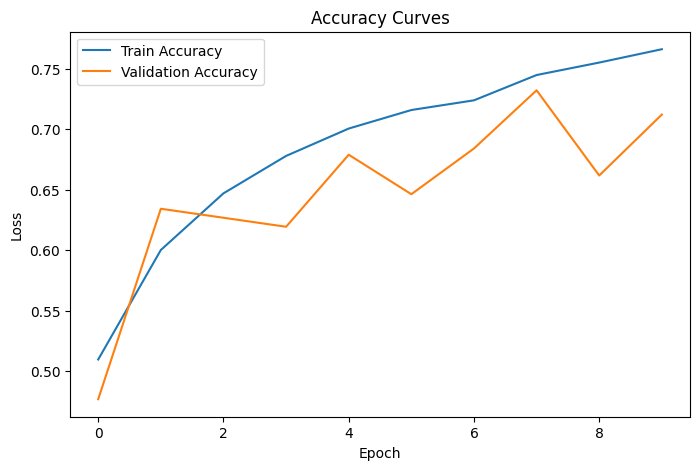

In [105]:
# accuracy curves

plt.figure(figsize = (8, 5))

plt.plot(history_m5["train_accs"], label = "Train Accuracy")
plt.plot(history_m5["val_accs"], label = "Validation Accuracy")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()

plt.title("Accuracy Curves")

plt.show()

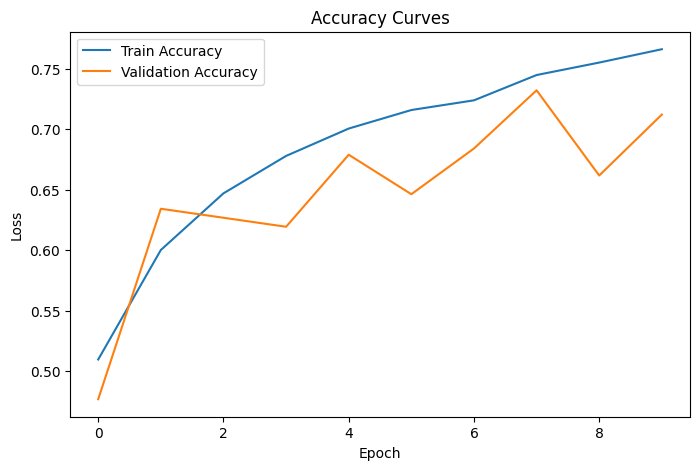

In [106]:
# accuracy curves

plt.figure(figsize = (8, 5))

plt.plot(history_m5["train_accs"], label = "Train Accuracy")
plt.plot(history_m5["val_accs"], label = "Validation Accuracy")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()

plt.title("Accuracy Curves")

plt.show()

In [108]:
m5_model.eval()

all_preds = []
all_labels = []

with torch.no_grad():

    for inputs, labels in waveform_val_loader:

        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = m5_model(inputs)

        preds = outputs.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

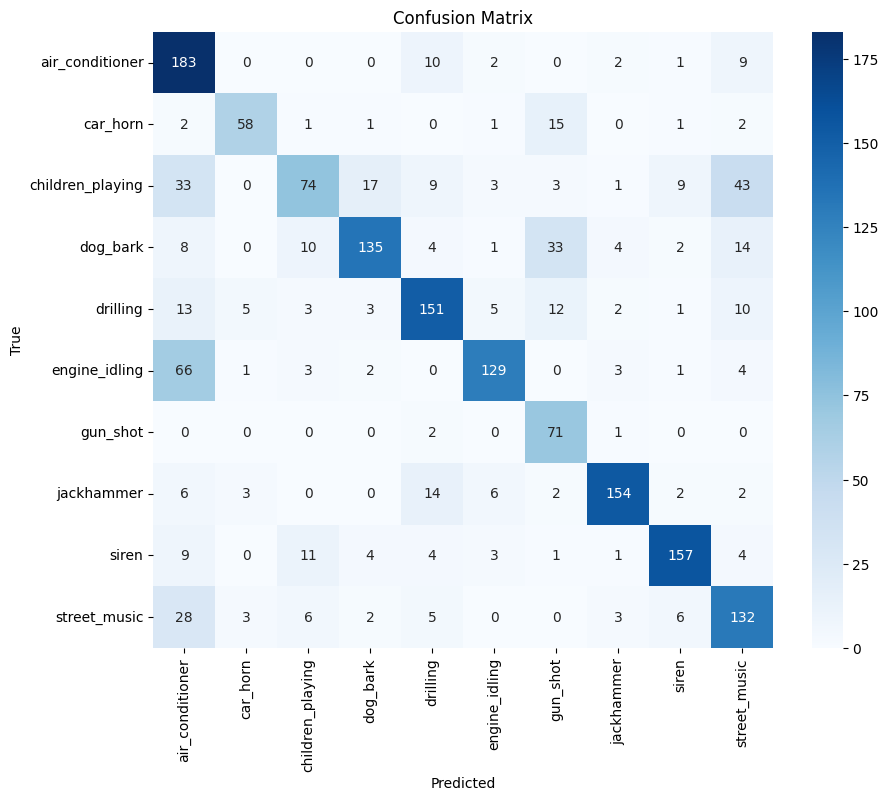

In [109]:
# confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns


cm = confusion_matrix(
    all_labels,
    all_preds
)

plt.figure(figsize = (10,8))

sns.heatmap(
    cm,
    annot = True,
    fmt = "d",
    cmap = "Blues",
    xticklabels = classes,
    yticklabels = classes
)

plt.xlabel("Predicted")
plt.ylabel("True")

plt.title("Confusion Matrix")

plt.show()

In [110]:
# classification report

from sklearn.metrics import classification_report


print(
    classification_report(
        all_labels,
        all_preds,
        target_names = classes
    )
)

                  precision    recall  f1-score   support

 air_conditioner       0.53      0.88      0.66       207
        car_horn       0.83      0.72      0.77        81
children_playing       0.69      0.39      0.49       192
        dog_bark       0.82      0.64      0.72       211
        drilling       0.76      0.74      0.75       205
   engine_idling       0.86      0.62      0.72       209
        gun_shot       0.52      0.96      0.67        74
      jackhammer       0.90      0.81      0.86       189
           siren       0.87      0.81      0.84       194
    street_music       0.60      0.71      0.65       185

        accuracy                           0.71      1747
       macro avg       0.74      0.73      0.71      1747
    weighted avg       0.75      0.71      0.71      1747



In [113]:
# error analysis

misclassified = []

with torch.no_grad():

    for inputs, labels in waveform_val_loader:

        outputs = m5_model(inputs.to(device))

        preds = outputs.argmax(dim=1)

        for i in range(len(labels)):

            if preds[i].cpu() != labels[i]:

                misclassified.append(
                    (
                        inputs[i],
                        labels[i],
                        preds[i].cpu()
                    )
                )

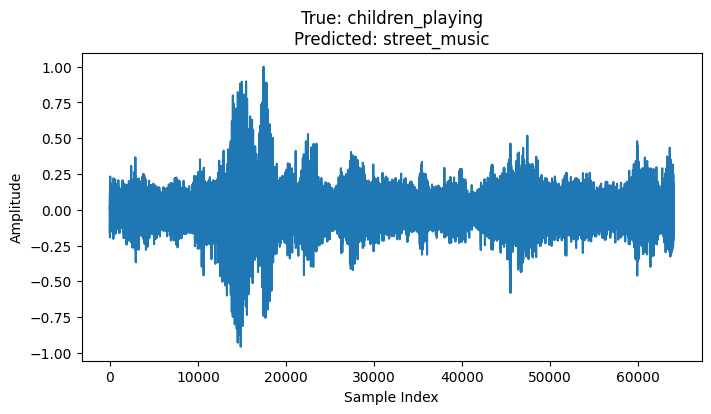

In [115]:
import matplotlib.pyplot as plt

# visualization

sample, true_label, pred_label = misclassified[0]

plt.figure(figsize=(8,4))

# Use plt.plot for 1D waveforms
plt.plot(
    sample[0].squeeze().cpu().numpy()
)

# Remove imshow-specific parameters (aspect, origin, colorbar)

plt.title(
    f"True: {idx_to_class[true_label.item()]}\n"
    f"Predicted: {idx_to_class[pred_label.item()]}"
)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")

plt.show()

In [116]:
save_path = "M5_model.pth"

torch.save(Resnet_model.state_dict(), save_path)

## Comparative Analysis

| Aspect              | ResNet18                           | M5                           |
| ------------------- | ---------------------------------- | ---------------------------- |
| Input               | Log-Mel Spectrogram                | Raw Waveform                 |
| Feature Engineering | Yes                                | No                           |
| CNN Type            | 2D                                 | 1D                           |
| Transfer Learning   | Yes                                | No                           |
| Validation Accuracy | **90.2%**                          | **76.1%**                    |
| Training Speed      | Fast (after freezing/fine-tuning)  | Moderate                     |
| Ease of Training    | Easier                             | Harder                       |
| Best Use Case       | High-accuracy audio classification | End-to-end waveform learning |


## Phase 7: Pipeline 3: Audio Spectrogram Transformer (AST)

A Transformer does not take raw audio directly. Its input is still a Log-Mel spectrogram.

The difference is how it processes the spectrogram.

```
Raw Audio
      │
      ▼
Log-Mel Spectrogram
      │
      ▼
Patch Embedding
      │
      ▼
Transformer Encoder
      │
      ▼
MLP Head
      │
      ▼
10 Classes
```

**Why does AST use spectrograms?**

Because Transformers were originally invented for text.

Later they were adapted to images using Vision Transformers (ViT).

AST is essentially: `ViT --> Applied to Audio Spectrograms`.

Instead of pixels, the transformer sees small spectrogram patches.

Suppose our Log-Mel spectrogram has shape
```
[1, 128, 126]
```
Instead of feeding the whole image, AST cuts it into small squares.

Example:
```
□□□□□□□□□□□□□□□□□□□□
□□□□□□□□□□□□□□□□□□□□
□□□□□□□□□□□□□□□□□□□□
□□□□□□□□□□□□□□□□□□□□
```
becomes patches
```
□ □ □ □
□ □ □ □
□ □ □ □
□ □ □ □
```
Each little square (patch) becomes a token.Exactly like words become tokens in NLP.

self-attention:

```
Patch A:
contains the beginning of a siren.
    ↓
The model asks:
"Which other patch helps me understand this sound?"
```
Maybe:
- Patch H contains the middle of the siren.
- Patch L contains the end of the siren.

The Transformer combines information from all three.

</br>

**What is familiar**

In NLP, if we have for example a Sentence:`I love machine learning`

Tokens:
```
[I]
[love]
[machine]
[learning]
```
Transformer processes tokens.

AST does exactly the same.
```
Spectrogram
    ↓
 Patches
    ↓
  Tokens
    ↓
Transformer
```

In [ ]:
import torch
import torch.nn as nn

from torch.utils.data import (
    Dataset,
    DataLoader
)

from torchaudio.transforms import (
    Resample,
    MelSpectrogram
)

from datasets import (
    load_dataset,
    DatasetDict
)

from matplotlib import pyplot as plt

In [ ]:
dataset = load_dataset("danavery/urbansound8k")

README.md:   0%|          | 0.00/5.66k [00:00<?, ?B/s]

data/train-00000-of-00016-e478d7cccca6a0(…): reconstructing file:   0%|          |  0.00B /  434MB            

data/train-00000-of-00016-e478d7cccca6a0(…): downloading bytes:           |  0.00B            

data/train-00001-of-00016-299138aa39afaa(…): reconstructing file:   0%|          |  0.00B /  472MB            

data/train-00001-of-00016-299138aa39afaa(…): downloading bytes:           |  0.00B            

data/train-00002-of-00016-887e0748205b6f(…): reconstructing file:   0%|          |  0.00B /  384MB            

data/train-00002-of-00016-887e0748205b6f(…): downloading bytes:           |  0.00B            

data/train-00003-of-00016-691ee48aa53d9c(…): reconstructing file:   0%|          |  0.00B /  447MB            

data/train-00003-of-00016-691ee48aa53d9c(…): downloading bytes:           |  0.00B            

data/train-00004-of-00016-c0f37514d8e28a(…): reconstructing file:   0%|          |  0.00B /  441MB            

data/train-00004-of-00016-c0f37514d8e28a(…): downloading bytes:           |  0.00B            

data/train-00005-of-00016-55ef1a0a51149c(…): reconstructing file:   0%|          |  0.00B /  591MB            

data/train-00005-of-00016-55ef1a0a51149c(…): downloading bytes:           |  0.00B            

data/train-00006-of-00016-0ef363072505e6(…): reconstructing file:   0%|          |  0.00B /  496MB            

data/train-00006-of-00016-0ef363072505e6(…): downloading bytes:           |  0.00B            

data/train-00007-of-00016-dfac173beb21e5(…): reconstructing file:   0%|          |  0.00B /  588MB            

data/train-00007-of-00016-dfac173beb21e5(…): downloading bytes:           |  0.00B            

data/train-00008-of-00016-2744487f32f65d(…): reconstructing file:   0%|          |  0.00B /  493MB            

data/train-00008-of-00016-2744487f32f65d(…): downloading bytes:           |  0.00B            

data/train-00009-of-00016-83fc7364d47981(…): reconstructing file:   0%|          |  0.00B /  549MB            

data/train-00009-of-00016-83fc7364d47981(…): downloading bytes:           |  0.00B            

data/train-00010-of-00016-4c1d0e285ed778(…): reconstructing file:   0%|          |  0.00B /  353MB            

data/train-00010-of-00016-4c1d0e285ed778(…): downloading bytes:           |  0.00B            

data/train-00011-of-00016-79d186503a2667(…): reconstructing file:   0%|          |  0.00B /  316MB            

data/train-00011-of-00016-79d186503a2667(…): downloading bytes:           |  0.00B            

data/train-00012-of-00016-6aff88fdcca229(…): reconstructing file:   0%|          |  0.00B /  372MB            

data/train-00012-of-00016-6aff88fdcca229(…): downloading bytes:           |  0.00B            

data/train-00013-of-00016-17d827b1a5be04(…): reconstructing file:   0%|          |  0.00B /  348MB            

data/train-00013-of-00016-17d827b1a5be04(…): downloading bytes:           |  0.00B            

data/train-00014-of-00016-c630762df85f6c(…): reconstructing file:   0%|          |  0.00B /  381MB            

data/train-00014-of-00016-c630762df85f6c(…): downloading bytes:           |  0.00B            

data/train-00015-of-00016-03506887d89adf(…): reconstructing file:   0%|          |  0.00B /  335MB            

data/train-00015-of-00016-03506887d89adf(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/8732 [00:00<?, ? examples/s]

In [ ]:
len(dataset), type(dataset)

(1, datasets.dataset_dict.DatasetDict)

In [ ]:
dataset["train"]

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 8732
})

In [ ]:
dataset["train"]["class"]

Column(['dog_bark', 'children_playing', 'children_playing', 'children_playing', 'children_playing'])

In [ ]:
class_names = list(set(dataset["train"]["class"]))

class_names

['air_conditioner',
 'jackhammer',
 'gun_shot',
 'street_music',
 'engine_idling',
 'car_horn',
 'children_playing',
 'siren',
 'drilling',
 'dog_bark']

In [ ]:
classes = sorted(class_names)

class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}

In [ ]:
class_to_idx

{'air_conditioner': 0,
 'car_horn': 1,
 'children_playing': 2,
 'dog_bark': 3,
 'drilling': 4,
 'engine_idling': 5,
 'gun_shot': 6,
 'jackhammer': 7,
 'siren': 8,
 'street_music': 9}

In [ ]:
idx_to_class

{0: 'air_conditioner',
 1: 'car_horn',
 2: 'children_playing',
 3: 'dog_bark',
 4: 'drilling',
 5: 'engine_idling',
 6: 'gun_shot',
 7: 'jackhammer',
 8: 'siren',
 9: 'street_music'}

In [ ]:
TARGET_SAMPLE_RATE = 16000

In [ ]:
# mel spectrogram transform
'''
n_fft: number of Fast Fourier Transform (FFT) components or window length
       used in audio processing libraries
hop_length: the number of audio samples between the start of two consecutive
            analysis windows (or frames) when computing a Short-Time Fourier
            Transform (STFT)
n_mels: refers to the number of Mel filter banks (or Mel bands) used to
        generate a Mel spectrogram
'''

mel_transform = MelSpectrogram(
    sample_rate = TARGET_SAMPLE_RATE,
    n_fft = 1024,
    hop_length = 512,
    n_mels = 128
)

In [ ]:
# converting to Log-Mel

def waveform_to_log_mel(waveform):

  mel_spec = mel_transform(waveform)

  log_mel_spec = torch.log(mel_spec + 1e-9)

  return log_mel_spec

In [ ]:
sample = dataset["train"][0]

sample

{'audio': <datasets.features._torchcodec.AudioDecoder at 0x7802ee274500>,
 'slice_file_name': '100032-3-0-0.wav',
 'fsID': 100032,
 'start': 0.0,
 'end': 0.317551,
 'salience': 1,
 'fold': 5,
 'classID': 3,
 'class': 'dog_bark'}

In [ ]:
sample.keys()

dict_keys(['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'])

In [ ]:
sample["audio"]

In [ ]:
dir(sample["audio"])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_decoder',
 '_desired_sample_rate',
 '_hf_encoded',
 'get_all_samples',
 'get_samples_played_in_range',
 'metadata',
 'stream_index']

In [ ]:
decoded = sample["audio"].get_all_samples()

decoded

AudioSamples:
  data (shape): torch.Size([2, 14004])
  pts_seconds: 0.0
  duration_seconds: 0.31755102040816324
  sample_rate: 44100

In [ ]:
dir(decoded)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__class_getitem__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__post_init__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 'data',
 'duration_seconds',
 'pts_seconds',
 'sample_rate']

In [ ]:
# train/validation split

split_dataset = dataset["train"].train_test_split(
    test_size = 0.2,
    seed = 42
)

train_dataset = split_dataset["train"]
val_dataset = split_dataset["test"]

In [ ]:
train_dataset

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 6985
})

In [ ]:
val_dataset

Dataset({
    features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
    num_rows: 1747
})

In [ ]:
print(f"train dataset size: {len(train_dataset)}")
print(f"validation dataset size: {len(val_dataset)}")

train dataset size: 6985
validation dataset size: 1747


In [ ]:
# preprocessing function

def preprocess_waveform(waveform, sample_rate):

    TARGET_SAMPLE_RATE = 16000
    TARGET_DURATION = 4
    TARGET_NUM_SAMPLES = TARGET_SAMPLE_RATE * TARGET_DURATION

    # stereo → mono
    if waveform.shape[0] > 1:
        waveform = waveform.mean(dim = 0, keepdim = True)

    # resampling
    if sample_rate != TARGET_SAMPLE_RATE:

        resampler = Resample(
            sample_rate,
            TARGET_SAMPLE_RATE
        )

        waveform = resampler(waveform)

    # padding
    if waveform.shape[1] < TARGET_NUM_SAMPLES:

        padding = TARGET_NUM_SAMPLES - waveform.shape[1]

        waveform = torch.nn.functional.pad(
            waveform,
            (0, padding)
        )

    # truncation
    else:

        waveform = waveform[:, :TARGET_NUM_SAMPLES]

    # normalization
    waveform = waveform / waveform.abs().max()

    return waveform

In [ ]:
class UrbanSoundDataset(Dataset):
  def __init__(self, hf_dataset, mel_transform):
    self.dataset = hf_dataset
    self.mel_transform = mel_transform

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):

    sample = self.dataset[idx]

    decoded = sample["audio"].get_all_samples()

    waveform = decoded.data
    sample_rate = decoded.sample_rate

    # preprocess
    waveform = preprocess_waveform(
        waveform,
        sample_rate
    )

    # mel spectrogram
    mel_spec = self.mel_transform(waveform)

    # log mel
    log_mel_spec = torch.log(mel_spec + 1e-9)

    # label: Convert string label to integer ID
    label = class_to_idx[sample["class"]]

    return log_mel_spec, label

In [ ]:
# creating Dataset objects

pytorch_train_dataset = UrbanSoundDataset(
    train_dataset,
    mel_transform
)

pytorch_val_dataset = UrbanSoundDataset(
    val_dataset,
    mel_transform
)

In [ ]:
pytorch_train_dataset, type(pytorch_train_dataset)

(<__main__.UrbanSoundDataset at 0x7802ee262b40>, __main__.UrbanSoundDataset)

In [ ]:
pytorch_val_dataset, type(pytorch_val_dataset)

(<__main__.UrbanSoundDataset at 0x7804e0276ab0>, __main__.UrbanSoundDataset)

In [ ]:
len(pytorch_train_dataset), len(pytorch_val_dataset)

(6985, 1747)

In [ ]:
print(f"train dataset size: {len(pytorch_train_dataset)}")
print(f"validation dataset size: {len(pytorch_val_dataset)}")

train dataset size: 6985
validation dataset size: 1747


In [ ]:
# creating DataLoaders

BATCH_SIZE = 64

train_loader = DataLoader(
    pytorch_train_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True
)

val_loader = DataLoader(
    pytorch_val_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False
)

In [ ]:
# inspecting batches

features, labels = next(iter(train_loader))

print(features.shape)
print(labels.shape)

torch.Size([64, 1, 128, 126])
torch.Size([64])


In [ ]:
features.dim()

4

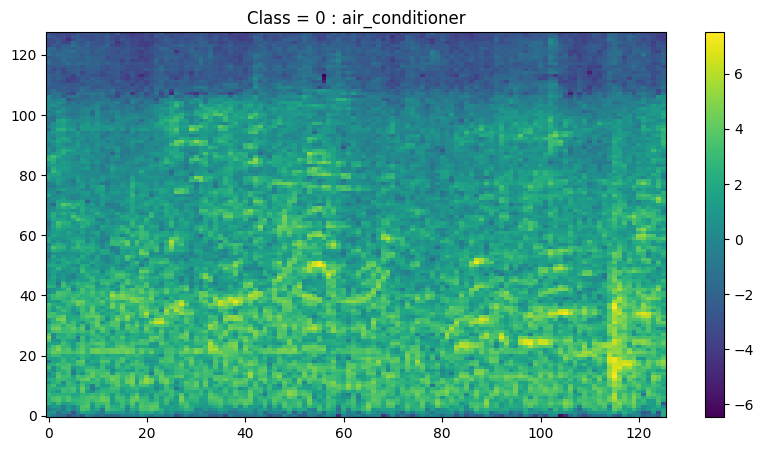

In [ ]:
# visualizing samples

plt.figure(figsize = (10,5))

plt.imshow(
    features[0][0],
    origin = "lower",
    aspect = "auto"
)

plt.colorbar()

label = labels[0].item()
label = idx_to_class[label]

plt.title(f"Class = {labels[0]} : {label}")

plt.show()

In [ ]:
# implementing Patch Embedding Layer
# i.e converting the image (mel spectrogram) into tokens (patches).

class PatchEmbedding(nn.Module):

    def __init__(
        self,
        in_channels = 1,
        patch_size = 16,
        embed_dim = 768 # This is the feature vector describing each token.
    ):

        super().__init__()

        self.projection = nn.Conv2d(
            in_channels = in_channels,
            out_channels = embed_dim,
            kernel_size = patch_size,
            stride = patch_size
        )

    def forward(self, x):

        # x shape:
        # [Batch, 1, 128, 126]

        x = self.projection(x)

        # [Batch, EmbedDim, H', W']

        x = x.flatten(2)

        # [Batch, EmbedDim, NumPatches]

        x = x.transpose(1, 2)

        # [Batch, NumPatches, EmbedDim]

        return x

In [ ]:
# verifying the patch embedding

patch_embed = PatchEmbedding()

spectrograms, labels = next(iter(train_loader))

patches = patch_embed(spectrograms)

print("Input shape:", spectrograms.shape)
print("Output shape:", patches.shape)

Input shape: torch.Size([64, 1, 128, 126])
Output shape: torch.Size([64, 56, 768])


**Shuffling the patches**

Would the Transformer notice?

No.

Why?

Because self-attention itself has no notion of order. Unlike a CNN, which has a fixed spatial layout, the Transformer only sees a set (or sequence) of embeddings unless we explicitly tell it where each token came from.

For a spectrogram, the position matters enormously:

A patch at the top represents high frequencies.
A patch at the bottom represents low frequencies.
A patch on the left corresponds to the beginning of the sound.
A patch on the right corresponds to the end.

Without positional information, those distinctions are lost.

**This leads us to the next major concept**

The Transformer needs two extra pieces of information before processing the tokens:
- **CLS Token** : a special learnable token that gathers information from all other patches and is used for classification.
- **Positional Embeddings** learnable vectors added to each patch embedding so the model knows where each patch came from in the spectrogram.

The input to the Transformer will therefore become:
```
[CLS]
Patch 1
Patch 2
Patch 3
...
Patch 56
  ↓
Add positional embeddings
  ↓
Transformer Encoder
```

we completed:

```
Log-Mel Spectrogram
        ↓
Patch Embedding
        ↓
[64, 56, 768]
```

### CLS Token and Positional Embeddings

we're missing two important things before sending these tokens into the Transformer:
- Where is each patch located?
- How do we get one representation for the entire audio clip?

These are solved by:
```
Positional Embedding
        +
     CLS Token
```

#### 1. Positional Embeddings

This is extremely important.

our 56 tokens originally came from a 2D spectrogram.

For example:
```
┌────┬────┬────┬────┬────┬────┬────┐
│ P1 │ P2 │ P3 │ P4 │ P5 │ P6 │ P7 │
├────┼────┼────┼────┼────┼────┼────┤
│ P8 │ P9 │... │... │... │... │... │
├────┼────┼────┼────┼────┼────┼────┤
│... │... │... │... │... │... │... │
└────┴────┴────┴────┴────┴────┴────┘
```

After patch embedding, we have:
```
[P1, P2, P3, ..., P56]
```

The Transformer sees a sequence.

But self-attention itself doesn't inherently know that:
```P1```

was at the top-left while:
```P56```

was at the bottom-right.

That's a problem for audio.

#### Why position matters for audio

Suppose we have:
```
P1 = beginning of a siren
P20 = middle of a siren
P40 = end of a siren
```
The model needs to know that these occur at different times.

Likewise:
```
top of spectrogram
        ↓
higher frequencies

bottom of spectrogram
        ↓
lower frequencies
```
Position contains meaningful information.

#### 2. How do we tell the Transformer the position?

We create a learnable vector for every position.

Since we have 56 patches and each embedding has 768 dimensions:
```
Position 1  → 768 numbers
Position 2  → 768 numbers
Position 3  → 768 numbers
...
Position 56 → 768 numbers
```
So we create:
```python
positional_embedding
```
with shape:
```
[1, 56, 768]
```
The `1` allows PyTorch to broadcast the positional embeddings across the batch.

Then:
```
Patch embedding
       +
Positional embedding
       ↓
Position-aware tokens
```

#### 3. The CLS Token

Now we have another problem.

The Transformer processes:
```
56 tokens
```
But our task is:
```
56 tokens
       ↓
What is this entire audio clip?
       ↓
10 classes
```
How do we obtain one representation for the whole audio?

This is where the CLS token comes in.

#### What is CLS?

CLS stands for:

**Classification**

We introduce a special learnable token:
```
[CLS]
```
So instead of:
```
P1
P2
P3
...
P56
```
we now have:
```
[CLS]
P1
P2
P3
...
P56
```
That's:
```57 tokens```

#### 4. What happens to CLS during attention?

This is the really interesting part.

Because of self-attention, CLS can attend to every patch:
```
             ┌── P1
             │
             ├── P2
             │
             ├── P3
             │
[CLS] ───────┼── ...
             │
             ├── P55
             │
             └── P56
```

Over multiple Transformer layers, the CLS token can accumulate information from the entire spectrogram.

Eventually:
```
[CLS]
   ↓
representation of the entire audio clip
   ↓
classification head
   ↓
10 classes
```
This is analogous to how a Transformer in NLP can use a special classification token to represent an entire sequence.

#### 5. Our sequence now looks like this

Before:
```
[ P1 ][ P2 ][ P3 ] ... [ P56 ]
```

After adding CLS:
```
[CLS][ P1 ][ P2 ][ P3 ] ... [ P56 ]
```

Shape changes from:
```
[64, 56, 768]
```

to:
```
[64, 57, 768]
```

#### 6. Implementing CLS + Positional Embeddings

adding another module.

In [ ]:
class TokenEmbedding(nn.Module):

    def __init__(
        self,
        num_patches,
        embed_dim = 768
    ):

        super().__init__()

        # Learnable CLS token
        self.cls_token = nn.Parameter(
            torch.randn(1, 1, embed_dim)
        )

        # Learnable positional embeddings
        self.pos_embedding = nn.Parameter(
            torch.randn(1, num_patches + 1, embed_dim)
        )

    def forward(self, x):

        # x:
        # [batch_size, num_patches, embed_dim]

        batch_size = x.size(0)

        # Expand CLS token across the batch
        cls_tokens = self.cls_token.expand(
            batch_size,
            -1,
            -1
        )

        # Add CLS to beginning of sequence
        x = torch.cat(
            [cls_tokens, x],
            dim=1
        )

        # Add positional information
        x = x + self.pos_embedding

        return x

In [ ]:
# testing the new TokenEmbedding

patch_embed = PatchEmbedding()
spectrograms, labels = next(iter(train_loader))
patches = patch_embed(spectrograms)

print(patches.shape)

torch.Size([64, 56, 768])


In [ ]:
token_embedding = TokenEmbedding(
    num_patches = 56,
    embed_dim = 768
)

tokens = token_embedding(patches)

print(tokens.shape)

torch.Size([64, 57, 768])


In [ ]:
# verifying the CLS token

print(token_embedding.cls_token.shape)

torch.Size([1, 1, 768])


In [ ]:
print(token_embedding.pos_embedding.shape)

torch.Size([1, 57, 768])


`57` refers to:
```
56 patches
    +
1 CLS token
    =
57 positions
```

The complete transformation so far

We started with:
```
Audio
  ↓
Preprocessing
  ↓
Log-Mel Spectrogram
  ↓
[1, 128, 126]
```

Then:
```
Patch Embedding
  ↓
[56, 768]
```

Then:
```
CLS + Positional Embedding
  ↓
[57, 768]
```

For a whole batch:
```
[64, 1, 128, 126]
        ↓
[64, 56, 768]
        ↓
[64, 57, 768]
```

And this **[batch, sequence, embedding]** tensor is now ready to enter the Transformer encoder.

In [ ]:
token_embedding = TokenEmbedding(
    num_patches = 56,
    embed_dim = 768
)

tokens = token_embedding(patches)

print("Patch tokens:", patches.shape)
print("Final tokens:", tokens.shape)

Patch tokens: torch.Size([64, 56, 768])
Final tokens: torch.Size([64, 57, 768])


the pipeline looks like:
```
Raw Audio
    ↓
Preprocessing
    ↓
Log-Mel Spectrogram
    ↓
[64, 1, 128, 126]
    ↓
Patch Embedding
    ↓
[64, 56, 768]
    ↓
Add CLS Token
    ↓
[64, 57, 768]
    ↓
Add Positional Embeddings
    ↓
[64, 57, 768]
    ↓
       ????
    ↓
Transformer Encoder
```

The ??? is what we're going to implement next.

### Transformer Encoder

The important thing is that we're not going to treat this as a black box immediately. We'll first understand what happens to your tensor.

input is:
```
[64, 57, 768]
```

which means:
```
64  → audio clips in the batch
57  → tokens per clip
768 → embedding dimensions
```

The Transformer will allow these 57 tokens to interact through self-attention.

Conceptually:
```
              ┌───────────────┐
              │ Transformer   │
              │   Encoder     │
              └───────┬───────┘
                      │
        ┌─────────────┼─────────────┐
        ↓             ↓             ↓
      [CLS]          P1            P2
        ↕             ↕             ↕
        └─────────────┼─────────────┘
                      ↕
                Self-Attention
                      ↕
             All 57 tokens
```

For example, the representation of a patch containing part of a siren could attend strongly to another patch containing a related part of the siren—even if those patches are far apart in the spectrogram.

That's the major difference from your CNN pipeline.

</br>

**CNN pipeline**

ResNet essentially learns:
```
local patterns
     ↓
larger patterns
     ↓
larger patterns
     ↓
global representation
```
</br>

**Transformer pipeline**

The Transformer can directly establish relationships between:
```
P1 ←→ P37
P2 ←→ P51
P8 ←→ P42
CLS ←→ every patch
```
through attention.

#### PyTorch's Transformer Encoder

For our first implementation, we will not manually implement Q, K, and V yet. We want to get the architecture working first.

PyTorch provides:
```
nn.TransformerEncoderLayer
```

and:
```
nn.TransformerEncoder
```

We'll configure one encoder layer as:
```python
encoder_layer = nn.TransformerEncoderLayer(
    d_model = 768,
    nhead = 8,
    dim_feedforward = 3072,
    dropout = 0.1,
    batch_first = True
)
```

The important parameters are:

```
d_model = 768
```

This must match your embedding dimension:
```
[64, 57, 768]
           ↑
        d_model
```

```
nhead=8
```

The 768-dimensional representation is divided among 8 attention heads:
```
768 / 8 = 96
```

So each attention head works with a 96-dimensional representation.

This allows different heads to learn different relationships.

```
dim_feedforward = 3072
```

Inside the Transformer layer there's also a feed-forward network.

Typically:
```
768
 ↓
3072
 ↓
768
```

```
batch_first = True
```

This is important because our tensor is:
```
[batch, sequence, embedding]
```

rather than PyTorch's older default:
```
[sequence, batch, embedding]
```

#### Building the Encoder

In [ ]:
class AudioTransformerEncoder(nn.Module):

    def __init__(
        self,
        embed_dim = 768,
        num_heads = 8,
        num_layers = 4,
        dropout = 0.1
    ):

        super().__init__()

        encoder_layer = nn.TransformerEncoderLayer(
            d_model = embed_dim,
            nhead = num_heads,
            dim_feedforward = embed_dim * 4,
            dropout = dropout,
            batch_first = True
        )

        self.encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers = num_layers
        )

    def forward(self, x):

        x = self.encoder(x)

        return x

We're starting with:
```
4 Transformer layers
8 attention heads
768 embedding dimension
```

That's a reasonable educational Mini-AST, rather than immediately trying to reproduce the full AST architecture.

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [ ]:
# testing the Transformer

encoder = AudioTransformerEncoder(
    embed_dim = 768,
    num_heads = 8,
    num_layers = 4
).to(device)

tokens = tokens.to(device)

encoded = encoder(tokens)

print("Input:", tokens.shape)
print("Output:", encoded.shape)

Input: torch.Size([64, 57, 768])
Output: torch.Size([64, 57, 768])


we get:
```
Input:  torch.Size([64, 57, 768])
Output: torch.Size([64, 57, 768])
```

we notice something interesting:

The shape doesn't change.

That's intentional.

The Transformer doesn't reduce:
```
57 tokens
```

into one token.

Instead it transforms the representation of each token.

So:
```
Before:

P1 → embedding
P2 → embedding
P3 → embedding
...
P56 → embedding


After self-attention:

P1 → contextualized embedding
P2 → contextualized embedding
P3 → contextualized embedding
...
P56 → contextualized embedding
```

Each token now contains information influenced by the other tokens.

And the CLS token becomes particularly important:
```
[CLS]
  ↓
attends to P1...P56
  ↓
becomes a representation of the whole audio
```

</br>

**One thing we should notice**

the tensor will remain:
```
[64, 57, 768]
```
before and after the encoder.

It might feel strange. We're going to use the CLS token in the next phase to turn this into:
```
[64, 768]
```

and then finally:
```
[64, 10]
```

for the UrbanSound8K classification task.

### CLS Token Extraction & Classification Head

at this point, we have:
```
Raw Audio
   ↓
Preprocessing
   ↓
Log-Mel Spectrogram
   ↓
Patch Embedding
   ↓
[Batch, 56, 768]
   ↓
CLS + Positional Embeddings
   ↓
[Batch, 57, 768]
   ↓
Transformer Encoder
   ↓
[Batch, 57, 768]
```

The Transformer has now produced a contextualized representation for every token.

The question is:

**How do we turn those 57 token representations into 10 class predictions?**

The answer is: we take the CLS token.

#### 1. Extracting CLS

Remember that we constructed the sequence as:
```
Position 0    → CLS
Position 1    → Patch 1
Position 2    → Patch 2
...
Position 56   → Patch 56
```

Therefore:
```
encoded[:, 0, :]
```
selects the CLS token.

If:
```
encoded.shape
```
is:
```
[64, 57, 768]
```
then:
```
cls_embedding = encoded[:, 0, :]
```
produces:
```
[64, 768]
```
Let's verify it.

In [ ]:
cls_embedding = encoded[:, 0, :]

print("Encoded:", encoded.shape)
print("CLS embedding:", cls_embedding.shape)

Encoded: torch.Size([64, 57, 768])
CLS embedding: torch.Size([64, 768])


#### 2. Why does CLS represent the whole audio?

This is the conceptual heart of this architecture.

Initially:
```
[CLS]
```
is simply a learnable vector.

But after passing through the Transformer:
```
[CLS]
   ↕
   P1
   ↕
   P2
   ↕
   P3
   ...
   ↕
   P56
```

Self-attention allows CLS to gather information from the patches.

After several layers, it becomes a representation containing information about the entire spectrogram.

So we can think of:
```
CLS
 ↓
"summary representation of this audio clip"
```

Then we give that representation to a classifier.

#### 3. Classification Head

Our dataset has: `10 classes`

Therefore we need:
```
768
 ↓
10
```
A simple linear layer is enough:
```python
classifier = nn.Linear(768, 10)
```

Then:
```
cls_embedding
       ↓
Linear layer
       ↓
10 logits
```

The output will be:
```
[64, 10]
```
Exactly what we need for CrossEntropyLoss.

#### 4. building the complete Mini-AST

Rather than keeping all these components separate, let's now combine them into one model.

In [ ]:
class MiniAST(nn.Module):

    def __init__(
        self,
        num_classes = 10,
        patch_size = 16,
        embed_dim = 768,
        num_heads = 8,
        num_layers = 4,
        dropout = 0.1
    ):

        super().__init__()

        # --------------------------------
        # 1. Patch Embedding
        # --------------------------------

        self.patch_embedding = PatchEmbedding(
            in_channels = 1,
            patch_size = patch_size,
            embed_dim = embed_dim
        )

        # --------------------------------
        # 2. Number of patches
        # --------------------------------

        # Spectrogram dimensions:
        # 128 x 126

        num_patches = (
            (128 // patch_size) *
            (126 // patch_size)
        )

        # --------------------------------
        # 3. CLS + Positional Embedding
        # --------------------------------

        self.token_embedding = TokenEmbedding(
            num_patches = num_patches,
            embed_dim = embed_dim
        )

        # --------------------------------
        # 4. Transformer Encoder
        # --------------------------------

        encoder_layer = nn.TransformerEncoderLayer(
            d_model = embed_dim,
            nhead = num_heads,
            dim_feedforward = embed_dim * 4,
            dropout = dropout,
            batch_first = True
        )

        self.encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers = num_layers
        )

        # --------------------------------
        # 5. Classification Head
        # --------------------------------

        self.classifier = nn.Linear(
            embed_dim,
            num_classes
        )

    def forward(self, x):

        # -------------------------------
        # Patch embedding
        # -------------------------------

        x = self.patch_embedding(x)

        # [B, 56, 768]

        # -------------------------------
        # CLS + positional embeddings
        # -------------------------------

        x = self.token_embedding(x)

        # [B, 57, 768]

        # -------------------------------
        # Transformer
        # -------------------------------

        x = self.encoder(x)

        # [B, 57, 768]

        # -------------------------------
        # Extract CLS
        # -------------------------------

        cls_embedding = x[:, 0, :]

        # [B, 768]

        # -------------------------------
        # Classification
        # -------------------------------

        logits = self.classifier(
            cls_embedding
        )

        # [B, 10]

        return logits

In [ ]:
# testing the complete model

model_ast = MiniAST(
    num_classes = 10,
    patch_size = 16,
    embed_dim = 768,
    num_heads = 8,
    num_layers = 4
).to(device)

In [ ]:
## getting a batch

spectrograms, labels = next(iter(train_loader))

spectrograms = spectrograms.to(device)
labels = labels.to(device)

In [ ]:
## running a forward pass

outputs = model_ast(spectrograms)

print("Input:", spectrograms.shape)
print("Output:", outputs.shape)

Input: torch.Size([64, 1, 128, 126])
Output: torch.Size([64, 10])


**The critical milestone**.

we've now gone from:`[64, 1, 128, 126]`

all the way to:`[64, 10]`

without using a pretrained AST.

#### 4. Understanding the complete Mini-AST architecture

```
                    RAW AUDIO
                        │
                        ↓
                 Preprocessing
                        │
                        ↓
                 Log-Mel Spectrogram
                        │
                        ↓
               [1 × 128 × 126]
                        │
                        ↓
                Patch Embedding
                        │
                        ↓
                56 Patch Tokens
                        │
                        ↓
                  Add CLS Token
                        │
                        ↓
              Add Positional Embeddings
                        │
                        ↓
                  57 Tokens
                        │
                        ↓
              Transformer Encoder
                        │
                        ↓
              Contextualized Tokens
                        │
                        ↓
                  Extract CLS
                        │
                        ↓
                  768 Features
                        │
                        ↓
                Linear Classifier
                        │
                        ↓
                    10 Classes
```

#### One important thing before training

we notice that our Mini-AST is considerably larger than our M5.

We have:
```
embed_dim = 768
num_heads = 8
num_layers = 4
```

and therefore training it from scratch on a Google Colab free GPU may be noticeably slower.

That's okay for understanding the architecture, but before we commit to a 10-epoch training run, we should propably first:
- Count the model parameters
- Run one training batch
- Measure one epoch
- Then decide whether 4 layers / 768 - dimensions is reasonable.

In [ ]:
total_params = sum(
    p.numel()
    for p in model_ast.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model_ast.parameters()
    if p.requires_grad
)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Total parameters: 28,601,098
Trainable parameters: 28,601,098


In [ ]:
# verification

outputs = model_ast(spectrograms)

loss = nn.CrossEntropyLoss()(
    outputs,
    labels
)

print("Output shape:", outputs.shape)
print("Loss:", loss.item())

Output shape: torch.Size([64, 10])
Loss: 2.441115617752075


### Training

In [ ]:
# sanity check

criterion_ast = nn.CrossEntropyLoss()

optimizer_ast = torch.optim.Adam(
    model_ast.parameters(),
    lr = 1e-4
)

In [ ]:
# training loop

def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0
    correct = 0
    total = 0

    for inputs, labels in loader:

        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        predictions = outputs.argmax(dim=1)

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

    epoch_loss = running_loss / len(loader)

    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [ ]:
# validation loop

def validate(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0
    correct = 0
    total = 0

    with torch.inference_mode():

        for inputs, labels in loader:

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += loss.item()

            predictions = outputs.argmax(dim=1)

            correct += (
                predictions == labels
            ).sum().item()

            total += labels.size(0)

    epoch_loss = running_loss / len(loader)

    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [ ]:
def training(
    epochs,
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    save_path
):

    train_losses = []
    val_losses = []

    train_accs = []
    val_accs = []

    best_val_acc = 0

    for epoch in range(epochs):

        train_loss, train_acc = train_one_epoch(
            model,
            train_loader,
            criterion,
            optimizer,
            device
        )

        val_loss, val_acc = validate(
            model,
            val_loader,
            criterion,
            device
        )

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        train_accs.append(train_acc)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:

            best_val_acc = val_acc

            torch.save(
                model.state_dict(),
                save_path
            )

        print(
            f"Epoch [{epoch+1}/{epochs}] "
            f"Train Loss: {train_loss:.4f} "
            f"Train Acc: {train_acc:.4f} "
            f"Val Loss: {val_loss:.4f} "
            f"Val Acc: {val_acc:.4f}"
        )

    history = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accs": train_accs,
        "val_accs": val_accs
    }

    return history

In [ ]:
from tqdm import tqdm
import time


start = time.time()

train_loss, train_acc = train_one_epoch(
    model_ast,
    train_loader,
    criterion_ast,
    optimizer_ast,
    device
)

val_loss, val_acc = validate(
    model_ast,
    val_loader,
    criterion_ast,
    device
)

end = time.time()

print(f"Train Loss: {train_loss:.4f}")
print(f"Train Acc:  {train_acc:.4f}")
print(f"Val Loss:   {val_loss:.4f}")
print(f"Val Acc:    {val_acc:.4f}")
print(f"Time:       {(end-start)/60:.2f} minutes")

Train Loss: 1.6817
Train Acc:  0.3798
Val Loss:   1.4349
Val Acc:    0.4837
Time:       3.25 minutes


**The Sanity check**

</br>

**What we're checking?**

We aren't concerned with achieving great accuracy after one epoch.

We're checking three things:

**1. Does training loss decrease from ~2.44?**

Ideally:
```
Initial loss ≈ 2.44
        ↓
After epoch 1 < 2.44
```

**2. Does accuracy move above random chance?**

With 10 classes, random guessing is approximately:
```
10%
```
So something like 30-50% after the first epoch would already indicate that learning is happening.

**3. How long does one epoch take?**

This is particularly important because the previous ResNet experience showed us that data loading/preprocessing can become a major bottleneck.

Once we know the one-epoch time, we can make an informed decision about whether to use:
```
10 epochs
```
or perhaps adjust the Mini-AST configuration.

And we don't change our dataset

This is important given the issue we diagnosed earlier.

we Keep:
```
pytorch_train_dataset
pytorch_val_dataset
```
and the existing:
```
train_loader
val_loader
```
exactly as they are.

The model doesn't care that the Dataset object was created earlier. The same DataLoader simply supplies batches of:
```
[64, 1, 128, 126]
```
to whichever model we're currently training.

So the workflow is:

                SAME DATA
                   │
        ┌──────────┼──────────┐
        ↓          ↓          ↓
     ResNet18      M5       Mini-AST
        │          │          │
        ↓          ↓          ↓
     results    results    results

That's exactly what we want for the three-pipeline experiment.

Comparing the initial state:
`
Initial loss ≈ 2.44
`
to after one epoch:
```
2.44 → 1.68 train
2.44 → 1.43 validation
```
That's a substantial improvement.

And random guessing for 10 classes would be approximately:
`
10%
`
while we're already at:
`
48.37% validation accuracy
`
after one epoch.

So the Mini-AST is learning.

In [ ]:
# training for 10 epochs as for 1 epoch sanity check we observed that the
# Mini-AST is learing

'''
Because we already trained one epoch manually, we don't start another
10 epochs on that same model_ast if we want exactly a 10-epoch experiment.

we have two choices:
  Option A — recommended: count your sanity-check epoch as Epoch 1 and
                          train 9 more epochs.
  Option B: reinitialize model_ast and optimizer, then run the complete
            10-epoch experiment from scratch.
'''

## let's go with option B reinitializing the model
model_ast = MiniAST(
    num_classes = 10,
    patch_size = 16,
    embed_dim = 768,
    num_heads = 8,
    num_layers = 4
).to(device)


criterion_ast = nn.CrossEntropyLoss()

optimizer_ast = torch.optim.Adam(
    model_ast.parameters(),
    lr = 1e-4
)

history_ast = training(
    epochs = 10,
    model = model_ast,
    train_loader = train_loader,
    val_loader = val_loader,
    criterion = criterion_ast,
    optimizer = optimizer_ast,
    device = device,
    save_path = "best_mini_ast.pth"
)

Epoch [1/10] Train Loss: 1.6006 Train Acc: 0.4074 Val Loss: 1.2715 Val Acc: 0.5552
Epoch [2/10] Train Loss: 1.0160 Train Acc: 0.6480 Val Loss: 0.8713 Val Acc: 0.7086
Epoch [3/10] Train Loss: 0.6698 Train Acc: 0.7758 Val Loss: 0.7498 Val Acc: 0.7539
Epoch [4/10] Train Loss: 0.4591 Train Acc: 0.8470 Val Loss: 0.6989 Val Acc: 0.7739
Epoch [5/10] Train Loss: 0.3347 Train Acc: 0.8893 Val Loss: 0.6298 Val Acc: 0.8060
Epoch [6/10] Train Loss: 0.2507 Train Acc: 0.9170 Val Loss: 0.6279 Val Acc: 0.8082
Epoch [7/10] Train Loss: 0.2007 Train Acc: 0.9351 Val Loss: 0.6737 Val Acc: 0.8054
Epoch [8/10] Train Loss: 0.1549 Train Acc: 0.9470 Val Loss: 0.5695 Val Acc: 0.8420
Epoch [9/10] Train Loss: 0.1168 Train Acc: 0.9603 Val Loss: 0.6998 Val Acc: 0.8191
Epoch [10/10] Train Loss: 0.0848 Train Acc: 0.9708 Val Loss: 0.6435 Val Acc: 0.8294


**The important observation**

From around Epoch 5 onward:
```
Training accuracy
88.9 → 91.7 → 93.5 → 94.7 → 96.0 → 97.1%
```

while validation accuracy fluctuates around:
```
80.6 → 80.8 → 80.5 → 84.2 → 81.9 → 82.9%
```
That is a classic sign that the model is beginning to overfit.

The model becomes increasingly good at the training data, but its generalization doesn't consistently improve.

</br>

**The best model is Epoch 8**

### Comparison

| Pipeline | Representation              | Architecture | Best/Final Val Accuracy |
| -------- | --------------------------- | ------------ | ----------------------: |
| **1**    | Log-Mel Spectrogram         | ResNet18     |              **90.15%** |
| **2**    | Raw Waveform                | M5           |              **76.13%** |
| **3**    | Log-Mel Spectrogram patches | Mini-AST     |              **84.20%** |

</br>

*Pipeline 1 wins on accuracy*
```
ResNet18 → 90.15%
Mini-AST → 84.20%
M5      → 76.13%
```
But we don't conclude yet that:

"ResNet is better than Transformers."

That would be too strong.

Note: We built a Mini-AST from scratch, with only 4 Transformer layers, while the ResNet used pretrained ImageNet weights.

That's a major experimental difference.

The ResNet benefited from transfer learning.

The Mini-AST did not.


### Conclusion

The result actually tells us something more nuanced:

```
For this experimental setup, the pretrained ResNet18 applied to log-Mel
spectrograms produced the strongest classification performance. The Mini-AST
learned a substantial amount of useful audio representation from scratch, but did
not match the pretrained CNN within the 10-epoch training budget.
```

### Evaluation

In [ ]:
# reloading Mini-AST

model_ast.load_state_dict(
    torch.load(
        "best_mini_ast.pth",
        map_location = device
    )
)

model_ast.eval()

MiniAST(
  (patch_embedding): PatchEmbedding(
    (projection): Conv2d(1, 768, kernel_size=(16, 16), stride=(16, 16))
  )
  (token_embedding): TokenEmbedding()
  (encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-3): 4 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (linear1): Linear(in_features=768, out_features=3072, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=3072, out_features=768, bias=True)
        (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (classifier): Linear(in_features=768, out_features=10, bias=True)
)

In [ ]:
print("Best Mini-AST checkpoint loaded.")

Best Mini-AST checkpoint loaded.


In [ ]:
# evaluating the entire validation set

all_predictions = []
all_labels = []

model_ast.eval()

with torch.inference_mode():

    for inputs, labels in val_loader:

        inputs = inputs.to(device)

        outputs = model_ast(inputs)

        predictions = outputs.argmax(dim=1)

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_labels.extend(
            labels.numpy()
        )

In [ ]:
# converting them to numpy arrays

import numpy as np

all_predictions = np.array(all_predictions)
all_labels = np.array(all_labels)

print("Predictions:", all_predictions.shape)
print("Labels:", all_labels.shape)

Predictions: (1747,)
Labels: (1747,)


In [ ]:
# calculating accuracy

from sklearn.metrics import accuracy_score

accuracy = accuracy_score(
    all_labels,
    all_predictions
)

print(f"Validation Accuracy: {accuracy:.4f}")
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

Validation Accuracy: 0.8420
Validation Accuracy: 84.20%


In [ ]:
# classification report

from sklearn.metrics import classification_report

report = classification_report(
    all_labels,
    all_predictions,
    target_names=classes
)

print(report)

                  precision    recall  f1-score   support

 air_conditioner       0.96      0.86      0.91       207
        car_horn       0.84      0.86      0.85        81
children_playing       0.67      0.77      0.72       192
        dog_bark       0.83      0.74      0.78       211
        drilling       0.86      0.79      0.82       205
   engine_idling       0.92      0.89      0.91       209
        gun_shot       0.90      0.95      0.92        74
      jackhammer       0.90      0.85      0.88       189
           siren       0.87      0.93      0.90       194
    street_music       0.74      0.86      0.80       185

        accuracy                           0.84      1747
       macro avg       0.85      0.85      0.85      1747
    weighted avg       0.85      0.84      0.84      1747



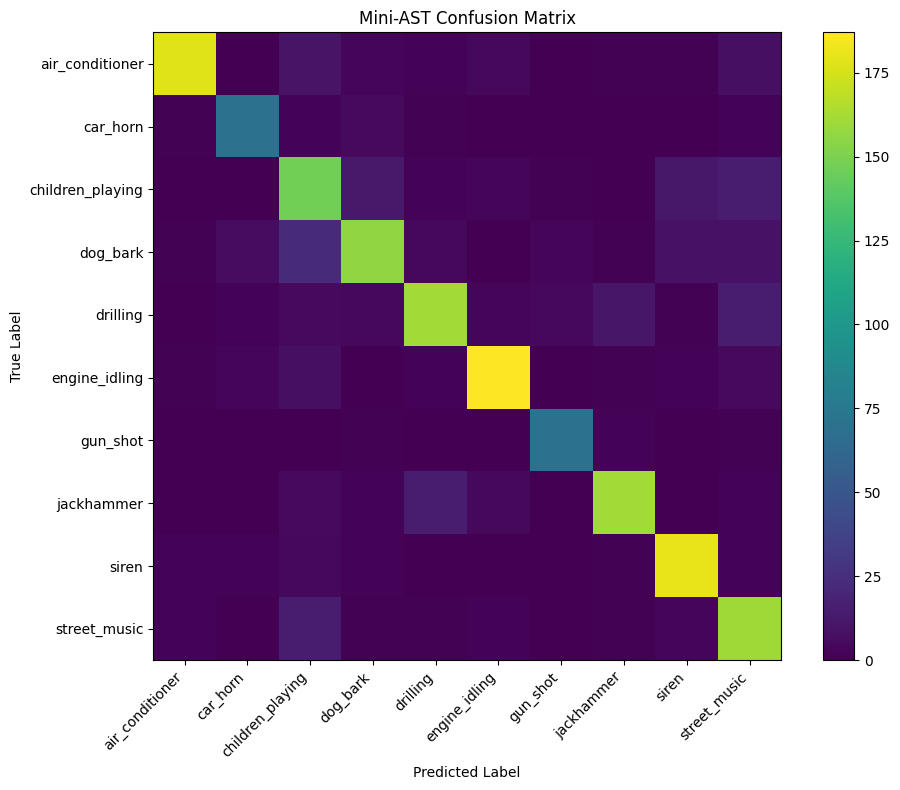

In [ ]:
# confusion matrix

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(
    all_labels,
    all_predictions
)

plt.figure(figsize=(10, 8))

plt.imshow(cm)

plt.xticks(
    range(len(classes)),
    classes,
    rotation=45,
    ha="right"
)

plt.yticks(
    range(len(classes)),
    classes
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Mini-AST Confusion Matrix")

plt.colorbar()

plt.tight_layout()

plt.show()

In [ ]:
# finding misclassing examples

misclassified_indices = np.where(
    all_predictions != all_labels
)[0]

print(
    f"Misclassified samples: "
    f"{len(misclassified_indices)}"
)

print(
    f"Total validation samples: "
    f"{len(all_labels)}"
)

Misclassified samples: 276
Total validation samples: 1747


In [ ]:
for idx in misclassified_indices[:10]:

    true_label = classes[all_labels[idx]]
    predicted_label = classes[all_predictions[idx]]

    print(
        f"Index: {idx} | "
        f"True: {true_label} | "
        f"Predicted: {predicted_label}"
    )

Index: 6 | True: car_horn | Predicted: dog_bark
Index: 20 | True: engine_idling | Predicted: street_music
Index: 26 | True: children_playing | Predicted: dog_bark
Index: 45 | True: street_music | Predicted: children_playing
Index: 49 | True: air_conditioner | Predicted: street_music
Index: 51 | True: dog_bark | Predicted: siren
Index: 56 | True: drilling | Predicted: jackhammer
Index: 57 | True: children_playing | Predicted: gun_shot
Index: 61 | True: air_conditioner | Predicted: children_playing
Index: 66 | True: dog_bark | Predicted: air_conditioner


# FINAL RESULTS AND REPORTS

**Results Table**

| **Model** | **Input Representation** | **Validation Accuracy** |
|---|---|---:|
| ResNet18 | Log-Mel Spectrogram | **90.84%** |
| M5 | Raw Waveform | **71.21%** |
| Mini-AST | Log-Mel Spectrogram + Patches | **84.20%** |

</br>

**Classification Report Analysis**

Three different approaches were evaluated for environmental audio classification on the UrbanSound8K dataset: ResNet18 operating on Log-Mel spectrograms, M5 operating directly on raw audio waveforms, and a Mini Audio Spectrogram Transformer (Mini-AST) operating on Log-Mel spectrogram patches.

The ResNet18 model achieved the highest validation accuracy of 90.84%, substantially outperforming both the Mini-AST model at 84.20% and the M5 model at 71.21%. This result indicates that, under the experimental conditions used, the combination of Log-Mel spectrogram representation and convolutional feature extraction was particularly effective for distinguishing the ten UrbanSound8K sound classes.

The M5 model achieved a validation accuracy of 71.21%. Although it directly processed the raw waveform without requiring a spectrogram representation, its performance was considerably lower than that of the two approaches based on Log-Mel spectrograms. This suggests that learning useful representations directly from the raw temporal waveform was more challenging for the relatively simple M5 architecture used in this experiment.

The Mini-AST model achieved a validation accuracy of 84.20%, placing it between ResNet18 and M5. The model demonstrated that Transformer-based self-attention can effectively process audio by representing different regions of a Log-Mel spectrogram as patches and learning relationships between these patches. Despite having approximately 28.6 million parameters, the Mini-AST did not outperform ResNet18 in this experiment.

The results should not be interpreted as evidence that convolutional networks are inherently superior to Transformers or that raw waveform models are inherently inferior. The comparison was performed using specific architectures, preprocessing configurations, initialization strategies, and training settings. In particular, **the ResNet18 model benefited from pretrained ImageNet weights and was subsequently fine-tuned for the audio classification task, whereas the M5 and Mini-AST models were trained from scratch.** Therefore, the results demonstrate the effectiveness of these particular approaches under the experimental conditions rather than establishing a universal ranking of the architectures.

Overall, the results demonstrate that the choice of audio representation has a substantial impact on classification performance. The Log-Mel representation provided a highly effective input representation for both the convolutional and Transformer-based approaches, with ResNet18 achieving the strongest overall classification performance.

</br>

**Classification Report and Metric Analysis**

In addition to accuracy, precision, recall, and F1-score were examined for each model using the classification reports generated from the validation set.

The ResNet18 model demonstrated the strongest overall classification performance, consistent with its 90.84% validation accuracy. Its classification report and per-class metrics provide evidence that the model was able to distinguish most of the ten sound categories effectively, although some classes remained more difficult than others.

The M5 model produced lower overall performance, with a validation accuracy of 71.21%. Its lower performance was also reflected in the class-level precision, recall, and F1-score values. Nevertheless, the model successfully learned useful temporal patterns directly from the raw waveform, demonstrating that end-to-end waveform classification is feasible without explicitly constructing a spectrogram.

The Mini-AST model achieved 84.20% validation accuracy and demonstrated strong classification capability despite being trained from scratch. Its performance indicates that patch-based representations of audio spectrograms can provide useful inputs for Transformer self-attention. However, its higher computational complexity did not translate into higher validation performance than the ResNet18 approach in the current experiment.

The comparison demonstrates that accuracy alone is not sufficient to evaluate an audio classification system. Precision, recall, and F1-score provide additional information about how consistently each model recognizes individual sound classes and help identify classes for which the models have difficulty maintaining a balance between false positives and false negatives.

</br>

**Computational Characteristics**

The three pipelines also differ considerably in their computational characteristics.

The ResNet18 architecture contains substantially fewer parameters than the Mini-AST model, while still achieving the highest validation accuracy. The Mini-AST model contains 28,601,098 parameters, making it considerably more computationally demanding than a conventional convolutional architecture. This illustrates that a larger model and a more sophisticated attention mechanism do not necessarily guarantee better classification performance.

The M5 architecture provides a comparatively lightweight approach to raw waveform processing and avoids the additional preprocessing required to construct a spectrogram. However, this computational simplicity was accompanied by lower classification performance in the current experiment.

Training time and inference latency are also important considerations when selecting a model for deployment. Although predictive accuracy was the primary criterion for selecting the demonstration model, computational characteristics should be considered when optimizing the system for real-time or resource-constrained environments.

Overall, the experiments demonstrate an important practical trade-off between predictive performance, model complexity, and computational requirements. The best-performing model is not necessarily the model with the most parameters or the most sophisticated architecture.

</br>

**Confusion Matrix Analysis**

Analysis of the confusion matrices revealed that the classification errors were not uniformly distributed across the ten UrbanSound8K classes. Instead, the models tended to make mistakes between acoustically similar sound categories.

The ResNet18 confusion matrix showed a strongly concentrated diagonal, indicating that the majority of validation samples were correctly classified. The relatively small number of off-diagonal predictions demonstrates the model's ability to distinguish most of the sound categories effectively. The remaining errors were primarily associated with classes that share similar spectral or temporal characteristics.

The M5 confusion matrix showed a greater number of off-diagonal predictions compared with ResNet18. This is consistent with its lower overall validation accuracy and suggests that learning directly from the waveform made it more difficult for the model to separate acoustically similar classes.

The Mini-AST confusion matrix showed that the Transformer was able to correctly classify a large proportion of the validation samples, although some confusion remained between acoustically related categories. The attention-based representation allowed the model to capture relationships between different time-frequency regions, but this did not completely eliminate ambiguity between similar environmental sounds.

Across the three approaches, the confusion matrices demonstrate that most errors occur between acoustically related categories rather than completely unrelated classes. This indicates that the models learned meaningful representations of environmental sounds but still face challenges when different classes exhibit overlapping acoustic characteristics.

</br>

**Error Analysis**

Manual inspection of misclassified examples provided further insight into the limitations of the three approaches.

For ResNet18, most misclassifications occurred between sound classes with similar time-frequency patterns. Since the model operates on Log-Mel spectrograms, it learns spatial patterns corresponding to frequency content and temporal evolution. When two sound categories produce similar spectro-temporal structures, the model may assign the sample to the visually similar class even when the underlying audio belongs to another category.

The M5 model exhibited a larger number of classification errors. Because the model processes the raw waveform directly, it must learn useful representations of frequency content, temporal patterns, and other acoustic characteristics from the one-dimensional signal itself. The error analysis suggests that the relatively simple temporal architecture had more difficulty separating classes with similar acoustic characteristics.

The Mini-AST model demonstrated stronger performance than M5 and was able to capture relationships between different regions of the spectrogram through self-attention. Nevertheless, some misclassified examples remained. These errors indicate that global attention does not completely resolve ambiguity when different sound classes contain similar spectral structures or when recordings contain background noise and variations in acoustic conditions.

The error analysis across all three pipelines demonstrates that model errors are generally meaningful rather than random. Misclassifications tend to occur between acoustically related categories, suggesting that the models have learned useful information about the underlying sound characteristics even when they fail to identify the exact class.

These observations also highlight the importance of examining individual misclassified examples rather than relying exclusively on aggregate metrics. Confusion matrices and manual inspection provide information about *why* a model makes mistakes and can guide future improvements such as data augmentation, class-specific preprocessing, improved architectures, or additional training examples for difficult class pairs.

</br>

**Overall Comparison and Model Selection**

The three experiments demonstrate different approaches to solving the same audio classification problem.

The M5 model demonstrated the feasibility of direct raw waveform classification but achieved the lowest validation accuracy at 76.13%. The Mini-AST model demonstrated that Transformer-based self-attention can be applied to audio spectrogram patches and achieved a stronger validation accuracy of 84.20%. ResNet18 achieved the highest validation accuracy of 90.15%, making it the strongest-performing approach among the three models under the experimental configuration used.

The ResNet18 model was therefore selected as the final model for the demonstration application. Its combination of strong classification performance, relatively established architecture, and effective processing of Log-Mel spectrograms makes it a practical choice for deployment in the next stage of the project.

The final system will therefore use the following pipeline:
```
Raw Audio → Preprocessing → Log-Mel Spectrogram → ResNet18 → 10-Class Prediction.
```
The demonstration will allow an audio sample to be provided to the system, processed using the same preprocessing pipeline used during training, and classified into one of the ten UrbanSound8K sound categories.

Overall, this project provided practical experience with three major approaches to audio machine learning: convolutional classification using time-frequency representations, temporal classification directly from raw waveforms, and Transformer-based attention over spectrogram patches. The experimental results demonstrate that audio representation and architectural choice have a significant influence on classification performance, while also highlighting the trade-offs between predictive accuracy, model complexity, and computational requirements.

The final results show that a carefully adapted vision-based CNN operating on Log-Mel spectrograms can provide a highly effective solution for environmental audio classification, achieving 90.84% validation accuracy in this experiment.